<a href="https://colab.research.google.com/github/harikrishnareddymallavarapu/schoolofai/blob/master/Assignment3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Loading the required libraries

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
from os import listdir
import matplotlib.pyplot as plt
from torch import optim
from tqdm import tqdm
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
from matplotlib import style

style.use("ggplot")

### Checking for GPU device


In [ ]:
if torch.cuda.is_available():
    device = torch.device("cuda:0")  # you can continue going on here, like cuda:1 cuda:2....etc. 
    print("Running on the GPU")
else:
    device = torch.device("cpu")
    print("Running on the CPU")

Running on the GPU


## Downloading the MNIST dataset to the root directory and transforming the images to Tensors

In [ ]:
%%capture
dataset = torchvision.datasets.MNIST(
    root='./data'
    ,train=True
    ,download=True
    ,transform=transforms.Compose([
        transforms.ToTensor()
    ])
)

#splitting the data to test and train
train_set, val_set = torch.utils.data.random_split(dataset, [50000, 10000])

### Understanding the dataset
Here the shape of the image is 1x28x28 3D tensor and label is a 1D tensor

In [ ]:
# Using the DataLoader to sample the data
train_loader = torch.utils.data.DataLoader(train_set
    ,batch_size=32
    ,shuffle=True
)

In [ ]:
dataIter = iter(train_loader)
image, labels = dataIter.next()
print(image.shape)
print(labels.shape)

torch.Size([32, 1, 28, 28])
torch.Size([32])


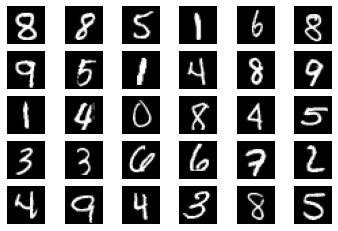

In [ ]:
# Plotting some samplepoints from dataset 
figure = plt.figure()
num_of_images = 30
for index in range(1, num_of_images + 1):
    plt.subplot(5, 6, index)
    plt.axis('off')
    plt.imshow(image[index].numpy().squeeze(), cmap='gray')

## Creating Custom dataset to include random numbers and generate labels which is sum of the random number and the image label

Here we have 2 inputs, the first one is a image matrix and the second input is a random number. The random number in the range of (0,9) is generated using the torch.randint method and its converted to one-hot vector representation

The desired output is to get the image label as one output and the other output is to get the sum of the random number and the image label. Output2 is converted to one-hot representation as we know from the problem that the min and max values would be in the range 0 to 18


In [ ]:
class MNISTAndRandomBinaryNumbers(Dataset):
  
  def __init__(self, mnistDataset):
    self.data = []

    #load the dataset
    #calculate the length dataset
    lengthOfDataset = len(mnistDataset)
    #calculate the shape of the dataset
    #Create a new list of random numbers
    randomNumbers = torch.randint(0,9,(lengthOfDataset,))
    #append the new label to the dataset
    #add the number to the label of the dataset to create sum output
    #create a vector representation of the sum output
    #append the sum vector and sum value as new dimensions to the dataset
    for i in range(lengthOfDataset):
      test = list(mnistDataset[i])
      test.append(self.getOneHotRepresentation(0,9,randomNumbers[i]))
      #test.append(self.getOneHotRepresentation(0,18,test[1]+randomNumbers[i]))
      test.append((torch.Tensor([test[1]+randomNumbers[i]])).type(torch.LongTensor))
      self.data.append(tuple(test))

  #returns a value fromt he dataset as a tuple based on the index provided
  def __getitem__(self, index):
    return self.data[index]

  #returns the length of the dataset
  def __len__(self):
    return len(self.data)

  #this function generates the one hot representations based on the min and max values
  def getOneHotRepresentation(self, lowValue,highValue, repValue):
    onehotRep = torch.zeros(highValue-lowValue+1)
    if (repValue<= highValue) & (repValue>= lowValue): 
      onehotRep[repValue-lowValue] =1
    return onehotRep


**Neural Network**
## Building the Neural Network Model
The Model takes 2 inputs and generates 2 outputs

Below are the steps on how the network processes the data in different layers

In this design we pass the first input in layer1 and the second input is appended in the layer 3. We could pass in layer 1 but in this design its chosen to pass in layer 3. The convolution layers are generally used for averaging out the impact from neigbourhood pixels which best suits for images so we chose to pass the random number from layer 3 

### Layer 1
1. The first input which is an image of 1x28x28 is passed through a convolution layer with a kernelsize = 5 and out channels as 6. The output of this layer is 6 outputs / features of the size 1x24x24. 
2. The first layer output is passed Relu activation and through Max pooling layer of kernel size 2 and stride 2. Each feature 1x24x24 is max pooled to 1x12x12 size

### Layer 2 
3. The output of the layer 1 is taken as input to second convolution layer which has a kernel size of 5 and out channels as 12. The 6 input tensors of size 1x12x12 is converted to 12 features of size 1x8x8.
4. The output of the second layer convolution operation is passed to a Relu activation and to a max pool layer with kernel 2 and stride 2. Each feature of 1x12x12 is max pooled to size 1x4x4

### Layer 3.a
5. The second input is passed as input to this layer. This layer takes 1x10 as input and generates 1xsizeDefinedByuser (passed as parameter to the model, here it is 30) as the output
6. This output is passed through a Relu activation layer

### Layer 3.b 
7. The 12 features from output of layer 2 is flattened to [1, 192] tensor and the second input is concatenated to this output. This concatenated tensor acts as input to layer 3
8.The layer 3 takes 1x222 vector as input and generates 120 features as output
9. weighted input of layer 3.b neurons are passed through relu activation function

### Layer 4
10. The layer 3 takes 1x120 vector as input and generates 1x60 features as output
11. The weighted input of layer 4 neurons are passed through relu activation function

### Layer 5
12. The layer 4 takes 1x60 vector as input and generates 1x45 features as output
13. The weighted input of layer 5 neurons are passed through relu activation function

### Layer 6 - Output 1
14. The layer 5 takes 1x45 vector as input and generates 1x10 features as output
15. The output of the layer 6 is passed through softmax function to generate the probabilites of the class 

### Layer 7 - Output 2
16. The layer 5 takes 1x45 vector as input and generates 1x19 features as output
17. The output of the layer 7 is passed through softmax function to generate the probabilites of the class 


In [ ]:
batchSize = 32
dataset = MNISTAndRandomBinaryNumbers(train_set)
train_loader = torch.utils.data.DataLoader(dataset
    ,batch_size=batchSize 
    ,shuffle=True
)

In [ ]:
class NetworkModel(nn.Module):

  def __init__(self, randomVectorSize):
    super(NetworkModel,self).__init__()
    self.conv1 = nn.Conv2d(in_channels=1, out_channels=6, kernel_size=5) #28x28 image is convoluted to 6 feature maps of size 24x24 and after max pooling it has size 12x12
    self.conv2 = nn.Conv2d(in_channels=6, out_channels=12, kernel_size=5) #12x12 image is convoluted to 12 feature maps of size 8x8 and after max pooling the size is 4x4
    self.fc0 = nn.Linear(in_features=10, out_features=randomVectorSize)
    self.fc1 = nn.Linear(in_features=(12 * 4 * 4)+randomVectorSize, out_features=120)
    self.fc2 = nn.Linear(in_features=120, out_features=60)
    self.fc3 = nn.Linear(in_features=60, out_features=45)
    self.out1 = nn.Linear(in_features=45, out_features=10)
    self.out2 = nn.Linear(in_features=45, out_features=19)

  def forward(self,x,y):
    shapeTracker =[]
    shapeTracker.append(x.shape)

    #input layer
    x=x
    y=y

    #Convolution Layer 1
    x = self.conv1(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2, stride=2)
    shapeTracker.append(x.shape)

    #Convolution Layer 2
    x = self.conv2(x)
    x = F.relu(x)
    x = F.max_pool2d(x, kernel_size=2, stride=2)
    shapeTracker.append(x.shape)

    #Linear Layer 0
    y = y.reshape(-1,10)
    y = self.fc0(y)
    y = F.relu(y)

    #Linear Layer 1
    x = x.reshape(-1, 12 * 4 * 4)
    #y = y.reshape(-1,10)
    #x = x.reshape(-1) 
    #x = x / x.sum(0).expand_as(x) #normalizing the vectors before concatenating
    #x = x.reshape(-1,12 * 4 * 4)
    x = torch.cat((x,y),dim=1)
    x = self.fc1(x)
    x = F.relu(x)
    shapeTracker.append(x.shape)
    
    #Linear Layer 2
    x = self.fc2(x)
    x = F.relu(x)
    shapeTracker.append(x.shape)

    #Linear Layer 3
    x = self.fc3(x)
    x = F.relu(x)
    shapeTracker.append(x.shape)
    
    #Output Layer - Output 1
    out1 = self.out1(x)
    out1 = F.softmax(out1, dim=1)

    #Output Layer - Output 2
    out2 = self.out2(x)
    out2 = F.softmax(out2, dim=1)

    return out1, out2


In [ ]:
network = NetworkModel(30)
network.to(device)
print(network)

NetworkModel(
  (conv1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(6, 12, kernel_size=(5, 5), stride=(1, 1))
  (fc0): Linear(in_features=10, out_features=30, bias=True)
  (fc1): Linear(in_features=222, out_features=120, bias=True)
  (fc2): Linear(in_features=120, out_features=60, bias=True)
  (fc3): Linear(in_features=60, out_features=45, bias=True)
  (out1): Linear(in_features=45, out_features=10, bias=True)
  (out2): Linear(in_features=45, out_features=19, bias=True)
)


# Training the Model

Following are the Hyperparameters that has been used for the training

1. Stochastic Gradient Descent Optimization technique has been used for training the model with learning rate of 0.001 and momentum 0.9

2. Cross entropy loss has been used for calculating the loss for both the outputs as the model generates probability distribution of the classes. Cross entropy generates high loss value when the model deviates from the actual prediction and generates small loss when the prediction is close.

3. The loss generated by both the outputs has been added to create a single loss and this has been used for gradient and back propagations. I have tried different by giving different weights to the losses but there is not much improvement in the model performance

4. Model is trained for 100 epochs. Under each epoch, the model is trained for every batch of 32 records and the weights are updated by calculating the loss at the end of each batch processing.

In [ ]:
def get_num_correct(preds, labels):
  #print(preds,labels)
  return preds.argmax(dim=1).eq(labels).sum().item()

In [ ]:
#pred, shapes = network(test[0][0].unsqueeze(0),test[0][2])
optimizer = optim.SGD(network.parameters(), lr=0.01, momentum=0.9)
criterion1 = nn.CrossEntropyLoss()
criterion2 = nn.CrossEntropyLoss()
epochs = 100

decrease_loss = []
images_correct = 0
random_sum_correct = 0

for e in tqdm(range(epochs)):
  total_loss = 0
  images_correct = 0
  random_sum_correct = 0
  i=0
  for images, labels,randomNumbers, sumlabels in train_loader:
    i+=1
    optimizer.zero_grad()
    output1,output2 = network(images.to(device),randomNumbers.to(device))

    loss1 = criterion1(output1, labels.to(device))
    loss2 = criterion2(output2,sumlabels.reshape(-1).to(device) )
    loss = loss1 + loss2
    loss.backward() #calculates the gradient
    optimizer.step() #Updating weights

    total_loss += loss.item()
    images_correct += get_num_correct(output1.to(device), labels.to(device))
    random_sum_correct += get_num_correct(output2.to(device), sumlabels.reshape(-1).to(device))#(sumlabels.reshape(batchSize)).type(torch.LongTensor).to(device))

    print(
        "Epoch: ", e, 
        "Iteration: ",i,
        "Loss: ", total_loss,
        "Image Labels Correct: ",images_correct,
        "Random Sum Correct: ",random_sum_correct
    )
  decrease_loss.append(total_loss)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch:  0 Iteration:  1 Loss:  5.244536399841309 Image Labels Correct:  6 Random Sum Correct:  1
Epoch:  0 Iteration:  2 Loss:  10.488804340362549 Image Labels Correct:  11 Random Sum Correct:  3
Epoch:  0 Iteration:  3 Loss:  15.736119747161865 Image Labels Correct:  14 Random Sum Correct:  4
Epoch:  0 Iteration:  4 Loss:  20.98188829421997 Image Labels Correct:  21 Random Sum Correct:  6
Epoch:  0 Iteration:  5 Loss:  26.22788667678833 Image Labels Correct:  23 Random Sum Correct:  8
Epoch:  0 Iteration:  6 Loss:  31.47358512878418 Image Labels Correct:  30 Random Sum Correct:  9
Epoch:  0 Iteration:  7 Loss:  36.718923568725586 Image Labels Correct:  34 Random Sum Correct:  10
Epoch:  0 Iteration:  8 Loss:  41.9654655456543 Image Labels Correct:  37 Random Sum Correct:  12
Epoch:  0 Iteration:  9 Loss:  47.21108531951904 Image Labels Correct:  42 Random Sum Correct:  14
Epoch:  0 Iteration:  10 Loss:  52.45947504043579 Image Labels Correct:  43 Random Sum Correct:  15
Epoch:  0 Iter

  1%|          | 1/100 [00:10<17:05, 10.36s/it]

Epoch:  0 Iteration:  1542 Loss:  8071.77210187912 Image Labels Correct:  5406 Random Sum Correct:  4304
Epoch:  0 Iteration:  1543 Loss:  8076.988071918488 Image Labels Correct:  5411 Random Sum Correct:  4306
Epoch:  0 Iteration:  1544 Loss:  8082.207789897919 Image Labels Correct:  5417 Random Sum Correct:  4307
Epoch:  0 Iteration:  1545 Loss:  8087.405839920044 Image Labels Correct:  5421 Random Sum Correct:  4311
Epoch:  0 Iteration:  1546 Loss:  8092.653133392334 Image Labels Correct:  5423 Random Sum Correct:  4311
Epoch:  0 Iteration:  1547 Loss:  8097.811990737915 Image Labels Correct:  5427 Random Sum Correct:  4315
Epoch:  0 Iteration:  1548 Loss:  8102.976921081543 Image Labels Correct:  5428 Random Sum Correct:  4324
Epoch:  0 Iteration:  1549 Loss:  8108.150234222412 Image Labels Correct:  5432 Random Sum Correct:  4328
Epoch:  0 Iteration:  1550 Loss:  8113.327766895294 Image Labels Correct:  5437 Random Sum Correct:  4330
Epoch:  0 Iteration:  1551 Loss:  8118.54999017

  2%|▏         | 2/100 [00:20<16:58, 10.39s/it]

Epoch:  1 Iteration:  1549 Loss:  7323.300516605377 Image Labels Correct:  32132 Random Sum Correct:  5282
Epoch:  1 Iteration:  1550 Loss:  7327.824153423309 Image Labels Correct:  32158 Random Sum Correct:  5287
Epoch:  1 Iteration:  1551 Loss:  7332.1833691596985 Image Labels Correct:  32189 Random Sum Correct:  5294
Epoch:  1 Iteration:  1552 Loss:  7336.693776607513 Image Labels Correct:  32216 Random Sum Correct:  5299
Epoch:  1 Iteration:  1553 Loss:  7341.261116981506 Image Labels Correct:  32243 Random Sum Correct:  5301
Epoch:  1 Iteration:  1554 Loss:  7345.781278133392 Image Labels Correct:  32270 Random Sum Correct:  5304
Epoch:  1 Iteration:  1555 Loss:  7350.399115085602 Image Labels Correct:  32296 Random Sum Correct:  5306
Epoch:  1 Iteration:  1556 Loss:  7354.844028949738 Image Labels Correct:  32326 Random Sum Correct:  5308
Epoch:  1 Iteration:  1557 Loss:  7359.373604774475 Image Labels Correct:  32354 Random Sum Correct:  5310
Epoch:  1 Iteration:  1558 Loss:  73

  3%|▎         | 3/100 [00:31<16:52, 10.44s/it]

Epoch:  2 Iteration:  1554 Loss:  7002.4597334861755 Image Labels Correct:  42709 Random Sum Correct:  5374
Epoch:  2 Iteration:  1555 Loss:  7006.884979724884 Image Labels Correct:  42739 Random Sum Correct:  5377
Epoch:  2 Iteration:  1556 Loss:  7011.359629154205 Image Labels Correct:  42767 Random Sum Correct:  5380
Epoch:  2 Iteration:  1557 Loss:  7015.949154376984 Image Labels Correct:  42793 Random Sum Correct:  5382
Epoch:  2 Iteration:  1558 Loss:  7020.398552417755 Image Labels Correct:  42823 Random Sum Correct:  5385
Epoch:  2 Iteration:  1559 Loss:  7024.96767950058 Image Labels Correct:  42851 Random Sum Correct:  5386
Epoch:  2 Iteration:  1560 Loss:  7029.492844581604 Image Labels Correct:  42878 Random Sum Correct:  5389
Epoch:  2 Iteration:  1561 Loss:  7033.937267780304 Image Labels Correct:  42908 Random Sum Correct:  5391
Epoch:  2 Iteration:  1562 Loss:  7038.366449832916 Image Labels Correct:  42937 Random Sum Correct:  5396
Epoch:  2 Iteration:  1563 Loss:  704

  4%|▍         | 4/100 [00:41<16:44, 10.47s/it]

Epoch:  4 Iteration:  1 Loss:  4.437186241149902 Image Labels Correct:  31 Random Sum Correct:  0
Epoch:  4 Iteration:  2 Loss:  8.818610191345215 Image Labels Correct:  63 Random Sum Correct:  4
Epoch:  4 Iteration:  3 Loss:  13.207967281341553 Image Labels Correct:  94 Random Sum Correct:  8
Epoch:  4 Iteration:  4 Loss:  17.681127071380615 Image Labels Correct:  123 Random Sum Correct:  11
Epoch:  4 Iteration:  5 Loss:  22.049551963806152 Image Labels Correct:  154 Random Sum Correct:  16
Epoch:  4 Iteration:  6 Loss:  26.434156894683838 Image Labels Correct:  185 Random Sum Correct:  21
Epoch:  4 Iteration:  7 Loss:  30.83678436279297 Image Labels Correct:  216 Random Sum Correct:  24
Epoch:  4 Iteration:  8 Loss:  35.25600481033325 Image Labels Correct:  245 Random Sum Correct:  29
Epoch:  4 Iteration:  9 Loss:  39.6593861579895 Image Labels Correct:  275 Random Sum Correct:  35
Epoch:  4 Iteration:  10 Loss:  44.096192836761475 Image Labels Correct:  305 Random Sum Correct:  38
E

  5%|▌         | 5/100 [00:52<16:40, 10.53s/it]

Epoch:  4 Iteration:  1559 Loss:  6852.301070690155 Image Labels Correct:  48261 Random Sum Correct:  5473
Epoch:  4 Iteration:  1560 Loss:  6856.683147907257 Image Labels Correct:  48292 Random Sum Correct:  5476
Epoch:  4 Iteration:  1561 Loss:  6861.062922954559 Image Labels Correct:  48323 Random Sum Correct:  5481
Epoch:  4 Iteration:  1562 Loss:  6865.462846279144 Image Labels Correct:  48355 Random Sum Correct:  5483
Epoch:  4 Iteration:  1563 Loss:  6869.84925365448 Image Labels Correct:  48371 Random Sum Correct:  5483
Epoch:  5 Iteration:  1 Loss:  4.3287482261657715 Image Labels Correct:  32 Random Sum Correct:  5
Epoch:  5 Iteration:  2 Loss:  8.758068561553955 Image Labels Correct:  62 Random Sum Correct:  7
Epoch:  5 Iteration:  3 Loss:  13.205699920654297 Image Labels Correct:  92 Random Sum Correct:  10
Epoch:  5 Iteration:  4 Loss:  17.587337493896484 Image Labels Correct:  124 Random Sum Correct:  11
Epoch:  5 Iteration:  5 Loss:  21.988629817962646 Image Labels Corre

  6%|▌         | 6/100 [01:03<16:34, 10.57s/it]

Epoch:  5 Iteration:  1560 Loss:  6838.325614452362 Image Labels Correct:  48655 Random Sum Correct:  5804
Epoch:  5 Iteration:  1561 Loss:  6842.6748814582825 Image Labels Correct:  48687 Random Sum Correct:  5809
Epoch:  5 Iteration:  1562 Loss:  6847.151201248169 Image Labels Correct:  48716 Random Sum Correct:  5812
Epoch:  5 Iteration:  1563 Loss:  6851.578659057617 Image Labels Correct:  48731 Random Sum Correct:  5814
Epoch:  6 Iteration:  1 Loss:  4.385299205780029 Image Labels Correct:  31 Random Sum Correct:  6
Epoch:  6 Iteration:  2 Loss:  8.764528751373291 Image Labels Correct:  62 Random Sum Correct:  9
Epoch:  6 Iteration:  3 Loss:  13.233022212982178 Image Labels Correct:  92 Random Sum Correct:  13
Epoch:  6 Iteration:  4 Loss:  17.682467937469482 Image Labels Correct:  121 Random Sum Correct:  15
Epoch:  6 Iteration:  5 Loss:  22.010976314544678 Image Labels Correct:  153 Random Sum Correct:  20
Epoch:  6 Iteration:  6 Loss:  26.393577098846436 Image Labels Correct:  

  7%|▋         | 7/100 [01:13<16:26, 10.60s/it]

Epoch:  6 Iteration:  1543 Loss:  6757.577841758728 Image Labels Correct:  48292 Random Sum Correct:  5627
Epoch:  6 Iteration:  1544 Loss:  6761.9456906318665 Image Labels Correct:  48323 Random Sum Correct:  5634
Epoch:  6 Iteration:  1545 Loss:  6766.304944515228 Image Labels Correct:  48355 Random Sum Correct:  5639
Epoch:  6 Iteration:  1546 Loss:  6770.69913816452 Image Labels Correct:  48386 Random Sum Correct:  5640
Epoch:  6 Iteration:  1547 Loss:  6775.078737735748 Image Labels Correct:  48417 Random Sum Correct:  5646
Epoch:  6 Iteration:  1548 Loss:  6779.479079246521 Image Labels Correct:  48448 Random Sum Correct:  5650
Epoch:  6 Iteration:  1549 Loss:  6783.791172504425 Image Labels Correct:  48480 Random Sum Correct:  5658
Epoch:  6 Iteration:  1550 Loss:  6788.129234790802 Image Labels Correct:  48511 Random Sum Correct:  5664
Epoch:  6 Iteration:  1551 Loss:  6792.515416622162 Image Labels Correct:  48543 Random Sum Correct:  5665
Epoch:  6 Iteration:  1552 Loss:  679

  8%|▊         | 8/100 [01:24<16:18, 10.64s/it]

Epoch:  7 Iteration:  1536 Loss:  6717.0926904678345 Image Labels Correct:  48211 Random Sum Correct:  5807
Epoch:  7 Iteration:  1537 Loss:  6721.4614424705505 Image Labels Correct:  48243 Random Sum Correct:  5810
Epoch:  7 Iteration:  1538 Loss:  6725.792370796204 Image Labels Correct:  48275 Random Sum Correct:  5815
Epoch:  7 Iteration:  1539 Loss:  6730.135078430176 Image Labels Correct:  48307 Random Sum Correct:  5819
Epoch:  7 Iteration:  1540 Loss:  6734.544566631317 Image Labels Correct:  48338 Random Sum Correct:  5821
Epoch:  7 Iteration:  1541 Loss:  6738.876257896423 Image Labels Correct:  48370 Random Sum Correct:  5827
Epoch:  7 Iteration:  1542 Loss:  6743.24399471283 Image Labels Correct:  48402 Random Sum Correct:  5828
Epoch:  7 Iteration:  1543 Loss:  6747.59198474884 Image Labels Correct:  48434 Random Sum Correct:  5834
Epoch:  7 Iteration:  1544 Loss:  6752.000467777252 Image Labels Correct:  48465 Random Sum Correct:  5838
Epoch:  7 Iteration:  1545 Loss:  675

  9%|▉         | 9/100 [01:35<16:13, 10.70s/it]

Epoch:  8 Iteration:  1545 Loss:  6738.039321422577 Image Labels Correct:  48545 Random Sum Correct:  6736
Epoch:  8 Iteration:  1546 Loss:  6742.331042766571 Image Labels Correct:  48576 Random Sum Correct:  6743
Epoch:  8 Iteration:  1547 Loss:  6746.72549200058 Image Labels Correct:  48608 Random Sum Correct:  6746
Epoch:  8 Iteration:  1548 Loss:  6751.138130664825 Image Labels Correct:  48639 Random Sum Correct:  6749
Epoch:  8 Iteration:  1549 Loss:  6755.5141434669495 Image Labels Correct:  48670 Random Sum Correct:  6754
Epoch:  8 Iteration:  1550 Loss:  6759.825147628784 Image Labels Correct:  48702 Random Sum Correct:  6760
Epoch:  8 Iteration:  1551 Loss:  6764.2031536102295 Image Labels Correct:  48733 Random Sum Correct:  6765
Epoch:  8 Iteration:  1552 Loss:  6768.637934207916 Image Labels Correct:  48764 Random Sum Correct:  6766
Epoch:  8 Iteration:  1553 Loss:  6772.999383926392 Image Labels Correct:  48795 Random Sum Correct:  6770
Epoch:  8 Iteration:  1554 Loss:  67

 10%|█         | 10/100 [01:46<16:03, 10.70s/it]

Epoch:  9 Iteration:  1540 Loss:  6573.072486162186 Image Labels Correct:  48052 Random Sum Correct:  12486
Epoch:  9 Iteration:  1541 Loss:  6577.252559900284 Image Labels Correct:  48084 Random Sum Correct:  12496
Epoch:  9 Iteration:  1542 Loss:  6581.408346891403 Image Labels Correct:  48115 Random Sum Correct:  12507
Epoch:  9 Iteration:  1543 Loss:  6585.6328666210175 Image Labels Correct:  48146 Random Sum Correct:  12517
Epoch:  9 Iteration:  1544 Loss:  6589.776638746262 Image Labels Correct:  48178 Random Sum Correct:  12528
Epoch:  9 Iteration:  1545 Loss:  6593.9444987773895 Image Labels Correct:  48210 Random Sum Correct:  12539
Epoch:  9 Iteration:  1546 Loss:  6598.073299646378 Image Labels Correct:  48242 Random Sum Correct:  12552
Epoch:  9 Iteration:  1547 Loss:  6602.170231103897 Image Labels Correct:  48274 Random Sum Correct:  12566
Epoch:  9 Iteration:  1548 Loss:  6606.353204011917 Image Labels Correct:  48306 Random Sum Correct:  12577
Epoch:  9 Iteration:  1549

 11%|█         | 11/100 [01:56<15:54, 10.72s/it]

Epoch:  10 Iteration:  1558 Loss:  6470.384105682373 Image Labels Correct:  48755 Random Sum Correct:  18454
Epoch:  10 Iteration:  1559 Loss:  6474.663683891296 Image Labels Correct:  48787 Random Sum Correct:  18461
Epoch:  10 Iteration:  1560 Loss:  6478.63187789917 Image Labels Correct:  48819 Random Sum Correct:  18478
Epoch:  10 Iteration:  1561 Loss:  6482.651176452637 Image Labels Correct:  48851 Random Sum Correct:  18493
Epoch:  10 Iteration:  1562 Loss:  6486.871452331543 Image Labels Correct:  48881 Random Sum Correct:  18503
Epoch:  10 Iteration:  1563 Loss:  6490.770349264145 Image Labels Correct:  48897 Random Sum Correct:  18512
Epoch:  11 Iteration:  1 Loss:  3.9799389839172363 Image Labels Correct:  32 Random Sum Correct:  17
Epoch:  11 Iteration:  2 Loss:  8.17960500717163 Image Labels Correct:  64 Random Sum Correct:  26
Epoch:  11 Iteration:  3 Loss:  12.257090091705322 Image Labels Correct:  96 Random Sum Correct:  40
Epoch:  11 Iteration:  4 Loss:  16.45301151275

 12%|█▏        | 12/100 [02:08<15:51, 10.81s/it]

Epoch:  11 Iteration:  1536 Loss:  6296.2158188819885 Image Labels Correct:  48190 Random Sum Correct:  20498
Epoch:  11 Iteration:  1537 Loss:  6300.370234012604 Image Labels Correct:  48221 Random Sum Correct:  20510
Epoch:  11 Iteration:  1538 Loss:  6304.244980812073 Image Labels Correct:  48253 Random Sum Correct:  20530
Epoch:  11 Iteration:  1539 Loss:  6308.425395965576 Image Labels Correct:  48283 Random Sum Correct:  20543
Epoch:  11 Iteration:  1540 Loss:  6312.475478649139 Image Labels Correct:  48315 Random Sum Correct:  20557
Epoch:  11 Iteration:  1541 Loss:  6316.479919910431 Image Labels Correct:  48347 Random Sum Correct:  20573
Epoch:  11 Iteration:  1542 Loss:  6320.515538692474 Image Labels Correct:  48379 Random Sum Correct:  20588
Epoch:  11 Iteration:  1543 Loss:  6324.586048603058 Image Labels Correct:  48410 Random Sum Correct:  20603
Epoch:  11 Iteration:  1544 Loss:  6328.710961818695 Image Labels Correct:  48442 Random Sum Correct:  20615
Epoch:  11 Iterati

 13%|█▎        | 13/100 [02:18<15:45, 10.86s/it]

Epoch:  12 Iteration:  1560 Loss:  6341.72421336174 Image Labels Correct:  48984 Random Sum Correct:  22389
Epoch:  12 Iteration:  1561 Loss:  6345.769404172897 Image Labels Correct:  49016 Random Sum Correct:  22403
Epoch:  12 Iteration:  1562 Loss:  6349.837288618088 Image Labels Correct:  49048 Random Sum Correct:  22417
Epoch:  12 Iteration:  1563 Loss:  6353.834658622742 Image Labels Correct:  49064 Random Sum Correct:  22425
Epoch:  13 Iteration:  1 Loss:  4.115472316741943 Image Labels Correct:  32 Random Sum Correct:  12
Epoch:  13 Iteration:  2 Loss:  8.089365720748901 Image Labels Correct:  64 Random Sum Correct:  29
Epoch:  13 Iteration:  3 Loss:  12.120969533920288 Image Labels Correct:  95 Random Sum Correct:  45
Epoch:  13 Iteration:  4 Loss:  16.23475193977356 Image Labels Correct:  127 Random Sum Correct:  57
Epoch:  13 Iteration:  5 Loss:  20.281704664230347 Image Labels Correct:  159 Random Sum Correct:  71
Epoch:  13 Iteration:  6 Loss:  24.230003118515015 Image Labe

 14%|█▍        | 14/100 [02:29<15:31, 10.83s/it]

Epoch:  13 Iteration:  1558 Loss:  6311.406271457672 Image Labels Correct:  48957 Random Sum Correct:  22973
Epoch:  13 Iteration:  1559 Loss:  6315.492242336273 Image Labels Correct:  48989 Random Sum Correct:  22986
Epoch:  13 Iteration:  1560 Loss:  6319.575654506683 Image Labels Correct:  49021 Random Sum Correct:  22999
Epoch:  13 Iteration:  1561 Loss:  6323.596150398254 Image Labels Correct:  49053 Random Sum Correct:  23014
Epoch:  13 Iteration:  1562 Loss:  6327.7116775512695 Image Labels Correct:  49085 Random Sum Correct:  23026
Epoch:  13 Iteration:  1563 Loss:  6331.703373908997 Image Labels Correct:  49101 Random Sum Correct:  23034
Epoch:  14 Iteration:  1 Loss:  3.934089422225952 Image Labels Correct:  32 Random Sum Correct:  18
Epoch:  14 Iteration:  2 Loss:  8.0310537815094 Image Labels Correct:  64 Random Sum Correct:  31
Epoch:  14 Iteration:  3 Loss:  12.206425905227661 Image Labels Correct:  94 Random Sum Correct:  43
Epoch:  14 Iteration:  4 Loss:  16.28767228126

 15%|█▌        | 15/100 [02:40<15:21, 10.84s/it]

Epoch:  14 Iteration:  1555 Loss:  6288.025712490082 Image Labels Correct:  48968 Random Sum Correct:  23145
Epoch:  14 Iteration:  1556 Loss:  6292.046511173248 Image Labels Correct:  49000 Random Sum Correct:  23160
Epoch:  14 Iteration:  1557 Loss:  6295.836599349976 Image Labels Correct:  49031 Random Sum Correct:  23183
Epoch:  14 Iteration:  1558 Loss:  6300.02979516983 Image Labels Correct:  49063 Random Sum Correct:  23193
Epoch:  14 Iteration:  1559 Loss:  6304.051678180695 Image Labels Correct:  49095 Random Sum Correct:  23208
Epoch:  14 Iteration:  1560 Loss:  6308.217549800873 Image Labels Correct:  49127 Random Sum Correct:  23218
Epoch:  14 Iteration:  1561 Loss:  6312.364129543304 Image Labels Correct:  49158 Random Sum Correct:  23230
Epoch:  14 Iteration:  1562 Loss:  6316.331254959106 Image Labels Correct:  49190 Random Sum Correct:  23247
Epoch:  14 Iteration:  1563 Loss:  6320.445578575134 Image Labels Correct:  49206 Random Sum Correct:  23253
Epoch:  15 Iteration

 16%|█▌        | 16/100 [02:51<15:06, 10.80s/it]

Epoch:  15 Iteration:  1550 Loss:  6258.362991809845 Image Labels Correct:  48853 Random Sum Correct:  23288
Epoch:  15 Iteration:  1551 Loss:  6262.392092704773 Image Labels Correct:  48885 Random Sum Correct:  23303
Epoch:  15 Iteration:  1552 Loss:  6266.324139118195 Image Labels Correct:  48917 Random Sum Correct:  23321
Epoch:  15 Iteration:  1553 Loss:  6270.251392841339 Image Labels Correct:  48949 Random Sum Correct:  23339
Epoch:  15 Iteration:  1554 Loss:  6274.280604362488 Image Labels Correct:  48981 Random Sum Correct:  23354
Epoch:  15 Iteration:  1555 Loss:  6278.266616821289 Image Labels Correct:  49013 Random Sum Correct:  23370
Epoch:  15 Iteration:  1556 Loss:  6282.347499370575 Image Labels Correct:  49044 Random Sum Correct:  23384
Epoch:  15 Iteration:  1557 Loss:  6286.400506496429 Image Labels Correct:  49076 Random Sum Correct:  23398
Epoch:  15 Iteration:  1558 Loss:  6290.508072853088 Image Labels Correct:  49108 Random Sum Correct:  23410
Epoch:  15 Iteratio

 17%|█▋        | 17/100 [03:02<14:56, 10.80s/it]

 Iteration:  1563 Loss:  6304.019420146942 Image Labels Correct:  49347 Random Sum Correct:  23573
Epoch:  17 Iteration:  1 Loss:  4.022574424743652 Image Labels Correct:  32 Random Sum Correct:  15
Epoch:  17 Iteration:  2 Loss:  7.942931413650513 Image Labels Correct:  64 Random Sum Correct:  33
Epoch:  17 Iteration:  3 Loss:  12.04959511756897 Image Labels Correct:  95 Random Sum Correct:  46
Epoch:  17 Iteration:  4 Loss:  16.195111513137817 Image Labels Correct:  125 Random Sum Correct:  59
Epoch:  17 Iteration:  5 Loss:  20.319798707962036 Image Labels Correct:  155 Random Sum Correct:  72
Epoch:  17 Iteration:  6 Loss:  24.228121995925903 Image Labels Correct:  186 Random Sum Correct:  92
Epoch:  17 Iteration:  7 Loss:  28.276856660842896 Image Labels Correct:  218 Random Sum Correct:  107
Epoch:  17 Iteration:  8 Loss:  32.27823758125305 Image Labels Correct:  250 Random Sum Correct:  123
Epoch:  17 Iteration:  9 Loss:  36.35115361213684 Image Labels Correct:  282 Random Sum Co

 18%|█▊        | 18/100 [03:12<14:44, 10.78s/it]

Epoch:  17 Iteration:  1556 Loss:  6272.358181476593 Image Labels Correct:  49159 Random Sum Correct:  23541
Epoch:  17 Iteration:  1557 Loss:  6276.3795437812805 Image Labels Correct:  49190 Random Sum Correct:  23557
Epoch:  17 Iteration:  1558 Loss:  6280.430854320526 Image Labels Correct:  49222 Random Sum Correct:  23571
Epoch:  17 Iteration:  1559 Loss:  6284.515031337738 Image Labels Correct:  49253 Random Sum Correct:  23585
Epoch:  17 Iteration:  1560 Loss:  6288.4436893463135 Image Labels Correct:  49285 Random Sum Correct:  23603
Epoch:  17 Iteration:  1561 Loss:  6292.492419242859 Image Labels Correct:  49316 Random Sum Correct:  23618
Epoch:  17 Iteration:  1562 Loss:  6296.544558048248 Image Labels Correct:  49348 Random Sum Correct:  23632
Epoch:  17 Iteration:  1563 Loss:  6300.596684455872 Image Labels Correct:  49364 Random Sum Correct:  23639
Epoch:  18 Iteration:  1 Loss:  3.930420398712158 Image Labels Correct:  32 Random Sum Correct:  18
Epoch:  18 Iteration:  2 L

 19%|█▉        | 19/100 [03:23<14:32, 10.78s/it]

Epoch:  18 Iteration:  1541 Loss:  6207.304737567902 Image Labels Correct:  48727 Random Sum Correct:  23421
Epoch:  18 Iteration:  1542 Loss:  6211.515378475189 Image Labels Correct:  48759 Random Sum Correct:  23430
Epoch:  18 Iteration:  1543 Loss:  6215.538045883179 Image Labels Correct:  48791 Random Sum Correct:  23445
Epoch:  18 Iteration:  1544 Loss:  6219.592367172241 Image Labels Correct:  48823 Random Sum Correct:  23459
Epoch:  18 Iteration:  1545 Loss:  6223.552760601044 Image Labels Correct:  48855 Random Sum Correct:  23476
Epoch:  18 Iteration:  1546 Loss:  6227.818825721741 Image Labels Correct:  48885 Random Sum Correct:  23485
Epoch:  18 Iteration:  1547 Loss:  6231.834655761719 Image Labels Correct:  48916 Random Sum Correct:  23501
Epoch:  18 Iteration:  1548 Loss:  6235.824486255646 Image Labels Correct:  48947 Random Sum Correct:  23518
Epoch:  18 Iteration:  1549 Loss:  6239.784083366394 Image Labels Correct:  48979 Random Sum Correct:  23535
Epoch:  18 Iteratio

 20%|██        | 20/100 [03:34<14:25, 10.81s/it]

Epoch:  19 Iteration:  1557 Loss:  6271.318909168243 Image Labels Correct:  49247 Random Sum Correct:  23654
Epoch:  19 Iteration:  1558 Loss:  6275.3089118003845 Image Labels Correct:  49279 Random Sum Correct:  23670
Epoch:  19 Iteration:  1559 Loss:  6279.354740619659 Image Labels Correct:  49311 Random Sum Correct:  23684
Epoch:  19 Iteration:  1560 Loss:  6283.445300102234 Image Labels Correct:  49341 Random Sum Correct:  23699
Epoch:  19 Iteration:  1561 Loss:  6287.529534339905 Image Labels Correct:  49372 Random Sum Correct:  23713
Epoch:  19 Iteration:  1562 Loss:  6291.545563220978 Image Labels Correct:  49403 Random Sum Correct:  23729
Epoch:  19 Iteration:  1563 Loss:  6295.658440113068 Image Labels Correct:  49419 Random Sum Correct:  23735
Epoch:  20 Iteration:  1 Loss:  4.020978927612305 Image Labels Correct:  32 Random Sum Correct:  15
Epoch:  20 Iteration:  2 Loss:  8.042140483856201 Image Labels Correct:  64 Random Sum Correct:  30
Epoch:  20 Iteration:  3 Loss:  12.1

 21%|██        | 21/100 [03:45<14:10, 10.76s/it]

Epoch:  20 Iteration:  1560 Loss:  6281.257400035858 Image Labels Correct:  49347 Random Sum Correct:  23762
Epoch:  20 Iteration:  1561 Loss:  6285.277812004089 Image Labels Correct:  49378 Random Sum Correct:  23778
Epoch:  20 Iteration:  1562 Loss:  6289.422963619232 Image Labels Correct:  49410 Random Sum Correct:  23789
Epoch:  20 Iteration:  1563 Loss:  6293.598228931427 Image Labels Correct:  49426 Random Sum Correct:  23794
Epoch:  21 Iteration:  1 Loss:  4.084883689880371 Image Labels Correct:  31 Random Sum Correct:  14
Epoch:  21 Iteration:  2 Loss:  8.201071739196777 Image Labels Correct:  63 Random Sum Correct:  26
Epoch:  21 Iteration:  3 Loss:  12.34755802154541 Image Labels Correct:  94 Random Sum Correct:  38
Epoch:  21 Iteration:  4 Loss:  16.243818283081055 Image Labels Correct:  126 Random Sum Correct:  57
Epoch:  21 Iteration:  5 Loss:  20.326293468475342 Image Labels Correct:  158 Random Sum Correct:  70
Epoch:  21 Iteration:  6 Loss:  24.320167064666748 Image Lab

 22%|██▏       | 22/100 [03:55<14:00, 10.78s/it]

Epoch:  21 Iteration:  1539 Loss:  6194.860579490662 Image Labels Correct:  48731 Random Sum Correct:  23444
Epoch:  21 Iteration:  1540 Loss:  6198.726879358292 Image Labels Correct:  48763 Random Sum Correct:  23464
Epoch:  21 Iteration:  1541 Loss:  6202.846313714981 Image Labels Correct:  48793 Random Sum Correct:  23478
Epoch:  21 Iteration:  1542 Loss:  6206.807016134262 Image Labels Correct:  48825 Random Sum Correct:  23495
Epoch:  21 Iteration:  1543 Loss:  6210.828349351883 Image Labels Correct:  48857 Random Sum Correct:  23510
Epoch:  21 Iteration:  1544 Loss:  6214.972048997879 Image Labels Correct:  48889 Random Sum Correct:  23521
Epoch:  21 Iteration:  1545 Loss:  6219.115660429001 Image Labels Correct:  48920 Random Sum Correct:  23533
Epoch:  21 Iteration:  1546 Loss:  6223.078675031662 Image Labels Correct:  48952 Random Sum Correct:  23550
Epoch:  21 Iteration:  1547 Loss:  6226.882604837418 Image Labels Correct:  48984 Random Sum Correct:  23572
Epoch:  21 Iteratio

 23%|██▎       | 23/100 [04:06<13:46, 10.74s/it]

Epoch:  22 Iteration:  1559 Loss:  6261.465975761414 Image Labels Correct:  49371 Random Sum Correct:  24189
Epoch:  22 Iteration:  1560 Loss:  6265.547213554382 Image Labels Correct:  49403 Random Sum Correct:  24202
Epoch:  22 Iteration:  1561 Loss:  6269.693542480469 Image Labels Correct:  49435 Random Sum Correct:  24213
Epoch:  22 Iteration:  1562 Loss:  6273.740476608276 Image Labels Correct:  49467 Random Sum Correct:  24227
Epoch:  22 Iteration:  1563 Loss:  6277.977571487427 Image Labels Correct:  49483 Random Sum Correct:  24231
Epoch:  23 Iteration:  1 Loss:  3.865807056427002 Image Labels Correct:  32 Random Sum Correct:  20
Epoch:  23 Iteration:  2 Loss:  7.913224697113037 Image Labels Correct:  63 Random Sum Correct:  35
Epoch:  23 Iteration:  3 Loss:  11.871408224105835 Image Labels Correct:  95 Random Sum Correct:  52
Epoch:  23 Iteration:  4 Loss:  15.924625158309937 Image Labels Correct:  127 Random Sum Correct:  66
Epoch:  23 Iteration:  5 Loss:  20.101104021072388 I

 24%|██▍       | 24/100 [04:17<13:34, 10.72s/it]

 1559 Loss:  6256.889663934708 Image Labels Correct:  49406 Random Sum Correct:  24293
Epoch:  23 Iteration:  1560 Loss:  6260.944837331772 Image Labels Correct:  49438 Random Sum Correct:  24307
Epoch:  23 Iteration:  1561 Loss:  6264.998158216476 Image Labels Correct:  49469 Random Sum Correct:  24322
Epoch:  23 Iteration:  1562 Loss:  6268.86851811409 Image Labels Correct:  49501 Random Sum Correct:  24342
Epoch:  23 Iteration:  1563 Loss:  6273.034148454666 Image Labels Correct:  49516 Random Sum Correct:  24349
Epoch:  24 Iteration:  1 Loss:  4.114621639251709 Image Labels Correct:  31 Random Sum Correct:  13
Epoch:  24 Iteration:  2 Loss:  8.137972831726074 Image Labels Correct:  63 Random Sum Correct:  28
Epoch:  24 Iteration:  3 Loss:  12.159997463226318 Image Labels Correct:  95 Random Sum Correct:  43
Epoch:  24 Iteration:  4 Loss:  16.30683422088623 Image Labels Correct:  126 Random Sum Correct:  55
Epoch:  24 Iteration:  5 Loss:  20.35919189453125 Image Labels Correct:  158

 25%|██▌       | 25/100 [04:27<13:22, 10.70s/it]

Epoch:  24 Iteration:  1549 Loss:  6214.300043582916 Image Labels Correct:  49140 Random Sum Correct:  24157
Epoch:  24 Iteration:  1550 Loss:  6218.2651381492615 Image Labels Correct:  49172 Random Sum Correct:  24174
Epoch:  24 Iteration:  1551 Loss:  6222.255244255066 Image Labels Correct:  49204 Random Sum Correct:  24190
Epoch:  24 Iteration:  1552 Loss:  6226.091625452042 Image Labels Correct:  49236 Random Sum Correct:  24211
Epoch:  24 Iteration:  1553 Loss:  6230.173824071884 Image Labels Correct:  49267 Random Sum Correct:  24225
Epoch:  24 Iteration:  1554 Loss:  6234.069096326828 Image Labels Correct:  49299 Random Sum Correct:  24244
Epoch:  24 Iteration:  1555 Loss:  6238.061082601547 Image Labels Correct:  49331 Random Sum Correct:  24260
Epoch:  24 Iteration:  1556 Loss:  6241.957635641098 Image Labels Correct:  49363 Random Sum Correct:  24279
Epoch:  24 Iteration:  1557 Loss:  6245.952170610428 Image Labels Correct:  49395 Random Sum Correct:  24295
Epoch:  24 Iterati

 26%|██▌       | 26/100 [04:38<13:13, 10.73s/it]

Epoch:  25 Iteration:  1557 Loss:  6242.829904317856 Image Labels Correct:  49432 Random Sum Correct:  24343
Epoch:  25 Iteration:  1558 Loss:  6246.881261110306 Image Labels Correct:  49462 Random Sum Correct:  24359
Epoch:  25 Iteration:  1559 Loss:  6250.932907819748 Image Labels Correct:  49494 Random Sum Correct:  24373
Epoch:  25 Iteration:  1560 Loss:  6254.86052441597 Image Labels Correct:  49526 Random Sum Correct:  24391
Epoch:  25 Iteration:  1561 Loss:  6258.852201700211 Image Labels Correct:  49557 Random Sum Correct:  24408
Epoch:  25 Iteration:  1562 Loss:  6262.964805364609 Image Labels Correct:  49589 Random Sum Correct:  24420
Epoch:  25 Iteration:  1563 Loss:  6267.01926112175 Image Labels Correct:  49605 Random Sum Correct:  24427
Epoch:  26 Iteration:  1 Loss:  4.022495746612549 Image Labels Correct:  32 Random Sum Correct:  15
Epoch:  26 Iteration:  2 Loss:  8.16567087173462 Image Labels Correct:  64 Random Sum Correct:  26
Epoch:  26 Iteration:  3 Loss:  12.18646

 27%|██▋       | 27/100 [04:49<13:03, 10.74s/it]

Epoch:  26 Iteration:  1550 Loss:  6215.3225927352905 Image Labels Correct:  49181 Random Sum Correct:  24239
Epoch:  26 Iteration:  1551 Loss:  6219.187523841858 Image Labels Correct:  49213 Random Sum Correct:  24259
Epoch:  26 Iteration:  1552 Loss:  6223.11478805542 Image Labels Correct:  49245 Random Sum Correct:  24277
Epoch:  26 Iteration:  1553 Loss:  6227.238892555237 Image Labels Correct:  49277 Random Sum Correct:  24289
Epoch:  26 Iteration:  1554 Loss:  6231.288502216339 Image Labels Correct:  49308 Random Sum Correct:  24304
Epoch:  26 Iteration:  1555 Loss:  6235.498468399048 Image Labels Correct:  49340 Random Sum Correct:  24313
Epoch:  26 Iteration:  1556 Loss:  6239.549645423889 Image Labels Correct:  49372 Random Sum Correct:  24327
Epoch:  26 Iteration:  1557 Loss:  6243.445762634277 Image Labels Correct:  49404 Random Sum Correct:  24346
Epoch:  26 Iteration:  1558 Loss:  6247.58212518692 Image Labels Correct:  49434 Random Sum Correct:  24359
Epoch:  26 Iteration

 28%|██▊       | 28/100 [05:00<12:53, 10.74s/it]

Epoch:  27 Iteration:  1537 Loss:  6155.019758939743 Image Labels Correct:  48741 Random Sum Correct:  24341
Epoch:  27 Iteration:  1538 Loss:  6159.041788816452 Image Labels Correct:  48773 Random Sum Correct:  24356
Epoch:  27 Iteration:  1539 Loss:  6162.87718129158 Image Labels Correct:  48805 Random Sum Correct:  24377
Epoch:  27 Iteration:  1540 Loss:  6166.7757070064545 Image Labels Correct:  48837 Random Sum Correct:  24396
Epoch:  27 Iteration:  1541 Loss:  6170.76509976387 Image Labels Correct:  48869 Random Sum Correct:  24412
Epoch:  27 Iteration:  1542 Loss:  6174.849373579025 Image Labels Correct:  48901 Random Sum Correct:  24425
Epoch:  27 Iteration:  1543 Loss:  6178.805206537247 Image Labels Correct:  48932 Random Sum Correct:  24443
Epoch:  27 Iteration:  1544 Loss:  6182.701919078827 Image Labels Correct:  48964 Random Sum Correct:  24462
Epoch:  27 Iteration:  1545 Loss:  6186.842966556549 Image Labels Correct:  48995 Random Sum Correct:  24474
Epoch:  27 Iteration

 29%|██▉       | 29/100 [05:10<12:42, 10.74s/it]

Epoch:  28 Iteration:  1553 Loss:  6195.742926597595 Image Labels Correct:  49289 Random Sum Correct:  25297
Epoch:  28 Iteration:  1554 Loss:  6199.762503623962 Image Labels Correct:  49321 Random Sum Correct:  25312
Epoch:  28 Iteration:  1555 Loss:  6203.717833518982 Image Labels Correct:  49352 Random Sum Correct:  25330
Epoch:  28 Iteration:  1556 Loss:  6207.773908138275 Image Labels Correct:  49384 Random Sum Correct:  25344
Epoch:  28 Iteration:  1557 Loss:  6211.856309890747 Image Labels Correct:  49416 Random Sum Correct:  25357
Epoch:  28 Iteration:  1558 Loss:  6215.814757823944 Image Labels Correct:  49448 Random Sum Correct:  25374
Epoch:  28 Iteration:  1559 Loss:  6219.619493484497 Image Labels Correct:  49480 Random Sum Correct:  25396
Epoch:  28 Iteration:  1560 Loss:  6223.638140201569 Image Labels Correct:  49512 Random Sum Correct:  25411
Epoch:  28 Iteration:  1561 Loss:  6227.657560348511 Image Labels Correct:  49543 Random Sum Correct:  25427
Epoch:  28 Iteratio

 30%|███       | 30/100 [05:21<12:33, 10.77s/it]

Epoch:  29 Iteration:  1553 Loss:  6194.354991912842 Image Labels Correct:  49300 Random Sum Correct:  25312
Epoch:  29 Iteration:  1554 Loss:  6198.282039165497 Image Labels Correct:  49332 Random Sum Correct:  25330
Epoch:  29 Iteration:  1555 Loss:  6202.242899894714 Image Labels Correct:  49362 Random Sum Correct:  25349
Epoch:  29 Iteration:  1556 Loss:  6206.15071105957 Image Labels Correct:  49394 Random Sum Correct:  25368
Epoch:  29 Iteration:  1557 Loss:  6210.1710414886475 Image Labels Correct:  49426 Random Sum Correct:  25383
Epoch:  29 Iteration:  1558 Loss:  6214.132718086243 Image Labels Correct:  49458 Random Sum Correct:  25400
Epoch:  29 Iteration:  1559 Loss:  6218.0309290885925 Image Labels Correct:  49490 Random Sum Correct:  25419
Epoch:  29 Iteration:  1560 Loss:  6221.803485870361 Image Labels Correct:  49522 Random Sum Correct:  25442
Epoch:  29 Iteration:  1561 Loss:  6225.855096817017 Image Labels Correct:  49554 Random Sum Correct:  25456
Epoch:  29 Iterati

 31%|███       | 31/100 [05:32<12:24, 10.79s/it]

Epoch:  30 Iteration:  1550 Loss:  6181.289270401001 Image Labels Correct:  49212 Random Sum Correct:  25292
Epoch:  30 Iteration:  1551 Loss:  6185.215871334076 Image Labels Correct:  49244 Random Sum Correct:  25310
Epoch:  30 Iteration:  1552 Loss:  6189.204432010651 Image Labels Correct:  49276 Random Sum Correct:  25326
Epoch:  30 Iteration:  1553 Loss:  6193.363561630249 Image Labels Correct:  49308 Random Sum Correct:  25337
Epoch:  30 Iteration:  1554 Loss:  6197.134328365326 Image Labels Correct:  49340 Random Sum Correct:  25360
Epoch:  30 Iteration:  1555 Loss:  6201.156476974487 Image Labels Correct:  49372 Random Sum Correct:  25375
Epoch:  30 Iteration:  1556 Loss:  6204.929306030273 Image Labels Correct:  49404 Random Sum Correct:  25398
Epoch:  30 Iteration:  1557 Loss:  6208.982940673828 Image Labels Correct:  49435 Random Sum Correct:  25413
Epoch:  30 Iteration:  1558 Loss:  6213.098541736603 Image Labels Correct:  49467 Random Sum Correct:  25425
Epoch:  30 Iteratio

 32%|███▏      | 32/100 [05:43<12:11, 10.75s/it]

Epoch:  31 Iteration:  1542 Loss:  6146.567509651184 Image Labels Correct:  49001 Random Sum Correct:  25198
Epoch:  31 Iteration:  1543 Loss:  6150.528137683868 Image Labels Correct:  49033 Random Sum Correct:  25215
Epoch:  31 Iteration:  1544 Loss:  6154.518105268478 Image Labels Correct:  49065 Random Sum Correct:  25231
Epoch:  31 Iteration:  1545 Loss:  6158.629098176956 Image Labels Correct:  49097 Random Sum Correct:  25243
Epoch:  31 Iteration:  1546 Loss:  6162.7719032764435 Image Labels Correct:  49129 Random Sum Correct:  25254
Epoch:  31 Iteration:  1547 Loss:  6166.700289964676 Image Labels Correct:  49161 Random Sum Correct:  25272
Epoch:  31 Iteration:  1548 Loss:  6170.775819540024 Image Labels Correct:  49193 Random Sum Correct:  25285
Epoch:  31 Iteration:  1549 Loss:  6174.929041147232 Image Labels Correct:  49224 Random Sum Correct:  25297
Epoch:  31 Iteration:  1550 Loss:  6178.887831449509 Image Labels Correct:  49255 Random Sum Correct:  25315
Epoch:  31 Iterati

 33%|███▎      | 33/100 [05:54<11:58, 10.73s/it]

Epoch:  32 Iteration:  1562 Loss:  6226.101325035095 Image Labels Correct:  49618 Random Sum Correct:  25549
Epoch:  32 Iteration:  1563 Loss:  6230.029915094376 Image Labels Correct:  49634 Random Sum Correct:  25558
Epoch:  33 Iteration:  1 Loss:  3.9470748901367188 Image Labels Correct:  32 Random Sum Correct:  17
Epoch:  33 Iteration:  2 Loss:  8.06000280380249 Image Labels Correct:  64 Random Sum Correct:  29
Epoch:  33 Iteration:  3 Loss:  12.047996044158936 Image Labels Correct:  96 Random Sum Correct:  45
Epoch:  33 Iteration:  4 Loss:  16.037551164627075 Image Labels Correct:  128 Random Sum Correct:  61
Epoch:  33 Iteration:  5 Loss:  20.05861210823059 Image Labels Correct:  160 Random Sum Correct:  76
Epoch:  33 Iteration:  6 Loss:  23.989490747451782 Image Labels Correct:  192 Random Sum Correct:  94
Epoch:  33 Iteration:  7 Loss:  27.979241609573364 Image Labels Correct:  224 Random Sum Correct:  110
Epoch:  33 Iteration:  8 Loss:  31.999730348587036 Image Labels Correct: 

 34%|███▍      | 34/100 [06:04<11:51, 10.78s/it]

Epoch:  33 Iteration:  1560 Loss:  6205.61302280426 Image Labels Correct:  49581 Random Sum Correct:  25880
Epoch:  33 Iteration:  1561 Loss:  6209.668397426605 Image Labels Correct:  49613 Random Sum Correct:  25894
Epoch:  33 Iteration:  1562 Loss:  6213.686328887939 Image Labels Correct:  49644 Random Sum Correct:  25910
Epoch:  33 Iteration:  1563 Loss:  6217.489518880844 Image Labels Correct:  49660 Random Sum Correct:  25921
Epoch:  34 Iteration:  1 Loss:  4.006988048553467 Image Labels Correct:  31 Random Sum Correct:  16
Epoch:  34 Iteration:  2 Loss:  7.8096537590026855 Image Labels Correct:  63 Random Sum Correct:  38
Epoch:  34 Iteration:  3 Loss:  11.953016757965088 Image Labels Correct:  95 Random Sum Correct:  49
Epoch:  34 Iteration:  4 Loss:  15.758668422698975 Image Labels Correct:  127 Random Sum Correct:  71
Epoch:  34 Iteration:  5 Loss:  19.68683958053589 Image Labels Correct:  159 Random Sum Correct:  89
Epoch:  34 Iteration:  6 Loss:  23.70797634124756 Image Labe

 35%|███▌      | 35/100 [06:15<11:41, 10.79s/it]

Epoch:  34 Iteration:  1549 Loss:  6160.263814687729 Image Labels Correct:  49226 Random Sum Correct:  25754
Epoch:  34 Iteration:  1550 Loss:  6164.313800096512 Image Labels Correct:  49258 Random Sum Correct:  25768
Epoch:  34 Iteration:  1551 Loss:  6168.3648245334625 Image Labels Correct:  49290 Random Sum Correct:  25782
Epoch:  34 Iteration:  1552 Loss:  6172.383307695389 Image Labels Correct:  49322 Random Sum Correct:  25797
Epoch:  34 Iteration:  1553 Loss:  6176.463217020035 Image Labels Correct:  49352 Random Sum Correct:  25812
Epoch:  34 Iteration:  1554 Loss:  6180.39089679718 Image Labels Correct:  49384 Random Sum Correct:  25830
Epoch:  34 Iteration:  1555 Loss:  6184.383233547211 Image Labels Correct:  49416 Random Sum Correct:  25846
Epoch:  34 Iteration:  1556 Loss:  6188.281310558319 Image Labels Correct:  49448 Random Sum Correct:  25865
Epoch:  34 Iteration:  1557 Loss:  6192.18741607666 Image Labels Correct:  49480 Random Sum Correct:  25884
Epoch:  34 Iteration

 36%|███▌      | 36/100 [06:26<11:29, 10.77s/it]

Epoch:  35 Iteration:  1539 Loss:  6116.749226570129 Image Labels Correct:  48945 Random Sum Correct:  25647
Epoch:  35 Iteration:  1540 Loss:  6120.740341663361 Image Labels Correct:  48977 Random Sum Correct:  25663
Epoch:  35 Iteration:  1541 Loss:  6124.760290145874 Image Labels Correct:  49009 Random Sum Correct:  25678
Epoch:  35 Iteration:  1542 Loss:  6128.779417037964 Image Labels Correct:  49041 Random Sum Correct:  25693
Epoch:  35 Iteration:  1543 Loss:  6132.695323467255 Image Labels Correct:  49073 Random Sum Correct:  25711
Epoch:  35 Iteration:  1544 Loss:  6136.435107707977 Image Labels Correct:  49105 Random Sum Correct:  25735
Epoch:  35 Iteration:  1545 Loss:  6140.421393871307 Image Labels Correct:  49137 Random Sum Correct:  25751
Epoch:  35 Iteration:  1546 Loss:  6144.347123146057 Image Labels Correct:  49169 Random Sum Correct:  25769
Epoch:  35 Iteration:  1547 Loss:  6148.366948127747 Image Labels Correct:  49200 Random Sum Correct:  25785
Epoch:  35 Iteratio

 37%|███▋      | 37/100 [06:37<11:17, 10.75s/it]

Epoch:  36 Iteration:  1556 Loss:  6182.388006210327 Image Labels Correct:  49506 Random Sum Correct:  25953
Epoch:  36 Iteration:  1557 Loss:  6186.439332962036 Image Labels Correct:  49537 Random Sum Correct:  25968
Epoch:  36 Iteration:  1558 Loss:  6190.366811275482 Image Labels Correct:  49569 Random Sum Correct:  25986
Epoch:  36 Iteration:  1559 Loss:  6194.294281005859 Image Labels Correct:  49601 Random Sum Correct:  26004
Epoch:  36 Iteration:  1560 Loss:  6198.321347236633 Image Labels Correct:  49633 Random Sum Correct:  26019
Epoch:  36 Iteration:  1561 Loss:  6202.368492126465 Image Labels Correct:  49664 Random Sum Correct:  26034
Epoch:  36 Iteration:  1562 Loss:  6206.3574595451355 Image Labels Correct:  49696 Random Sum Correct:  26050
Epoch:  36 Iteration:  1563 Loss:  6210.221365690231 Image Labels Correct:  49712 Random Sum Correct:  26060
Epoch:  37 Iteration:  1 Loss:  4.051918029785156 Image Labels Correct:  31 Random Sum Correct:  15
Epoch:  37 Iteration:  2 Lo

 38%|███▊      | 38/100 [06:47<11:05, 10.73s/it]

Epoch:  37 Iteration:  1552 Loss:  6165.853283882141 Image Labels Correct:  49403 Random Sum Correct:  25881
Epoch:  37 Iteration:  1553 Loss:  6169.871670246124 Image Labels Correct:  49435 Random Sum Correct:  25896
Epoch:  37 Iteration:  1554 Loss:  6173.829408168793 Image Labels Correct:  49467 Random Sum Correct:  25913
Epoch:  37 Iteration:  1555 Loss:  6177.78689956665 Image Labels Correct:  49498 Random Sum Correct:  25931
Epoch:  37 Iteration:  1556 Loss:  6181.840316772461 Image Labels Correct:  49529 Random Sum Correct:  25946
Epoch:  37 Iteration:  1557 Loss:  6185.7967138290405 Image Labels Correct:  49561 Random Sum Correct:  25963
Epoch:  37 Iteration:  1558 Loss:  6189.817147254944 Image Labels Correct:  49593 Random Sum Correct:  25978
Epoch:  37 Iteration:  1559 Loss:  6193.6551995277405 Image Labels Correct:  49625 Random Sum Correct:  25999
Epoch:  37 Iteration:  1560 Loss:  6197.704829692841 Image Labels Correct:  49657 Random Sum Correct:  26013
Epoch:  37 Iterati

 39%|███▉      | 39/100 [06:58<10:53, 10.71s/it]

Epoch:  38 Iteration:  1546 Loss:  6141.374814271927 Image Labels Correct:  49212 Random Sum Correct:  25789
Epoch:  38 Iteration:  1547 Loss:  6145.29722905159 Image Labels Correct:  49244 Random Sum Correct:  25807
Epoch:  38 Iteration:  1548 Loss:  6149.315779924393 Image Labels Correct:  49276 Random Sum Correct:  25822
Epoch:  38 Iteration:  1549 Loss:  6153.425008058548 Image Labels Correct:  49306 Random Sum Correct:  25836
Epoch:  38 Iteration:  1550 Loss:  6157.354425668716 Image Labels Correct:  49338 Random Sum Correct:  25854
Epoch:  38 Iteration:  1551 Loss:  6161.3100526332855 Image Labels Correct:  49370 Random Sum Correct:  25871
Epoch:  38 Iteration:  1552 Loss:  6165.324505567551 Image Labels Correct:  49401 Random Sum Correct:  25887
Epoch:  38 Iteration:  1553 Loss:  6169.3752653598785 Image Labels Correct:  49433 Random Sum Correct:  25901
Epoch:  38 Iteration:  1554 Loss:  6173.362822294235 Image Labels Correct:  49465 Random Sum Correct:  25917
Epoch:  38 Iterati

 40%|████      | 40/100 [07:09<10:43, 10.72s/it]

Epoch:  39 Iteration:  1542 Loss:  6124.819113254547 Image Labels Correct:  49078 Random Sum Correct:  25735
Epoch:  39 Iteration:  1543 Loss:  6128.87051820755 Image Labels Correct:  49110 Random Sum Correct:  25749
Epoch:  39 Iteration:  1544 Loss:  6132.79671049118 Image Labels Correct:  49141 Random Sum Correct:  25768
Epoch:  39 Iteration:  1545 Loss:  6136.7844042778015 Image Labels Correct:  49173 Random Sum Correct:  25784
Epoch:  39 Iteration:  1546 Loss:  6140.744566917419 Image Labels Correct:  49205 Random Sum Correct:  25801
Epoch:  39 Iteration:  1547 Loss:  6144.606969833374 Image Labels Correct:  49237 Random Sum Correct:  25821
Epoch:  39 Iteration:  1548 Loss:  6148.470742225647 Image Labels Correct:  49269 Random Sum Correct:  25841
Epoch:  39 Iteration:  1549 Loss:  6152.5193247795105 Image Labels Correct:  49301 Random Sum Correct:  25855
Epoch:  39 Iteration:  1550 Loss:  6156.478717803955 Image Labels Correct:  49333 Random Sum Correct:  25872
Epoch:  39 Iteratio

 41%|████      | 41/100 [07:19<10:30, 10.69s/it]

Epoch:  40 Iteration:  1545 Loss:  6133.584210395813 Image Labels Correct:  49231 Random Sum Correct:  25806
Epoch:  40 Iteration:  1546 Loss:  6137.542779445648 Image Labels Correct:  49263 Random Sum Correct:  25823
Epoch:  40 Iteration:  1547 Loss:  6141.654505252838 Image Labels Correct:  49295 Random Sum Correct:  25835
Epoch:  40 Iteration:  1548 Loss:  6145.549960374832 Image Labels Correct:  49326 Random Sum Correct:  25855
Epoch:  40 Iteration:  1549 Loss:  6149.506246328354 Image Labels Correct:  49358 Random Sum Correct:  25872
Epoch:  40 Iteration:  1550 Loss:  6153.679345846176 Image Labels Correct:  49390 Random Sum Correct:  25882
Epoch:  40 Iteration:  1551 Loss:  6157.6346871852875 Image Labels Correct:  49422 Random Sum Correct:  25899
Epoch:  40 Iteration:  1552 Loss:  6161.683661222458 Image Labels Correct:  49454 Random Sum Correct:  25913
Epoch:  40 Iteration:  1553 Loss:  6165.547251939774 Image Labels Correct:  49486 Random Sum Correct:  25933
Epoch:  40 Iterati

 42%|████▏     | 42/100 [07:30<10:20, 10.70s/it]

 Iteration:  1562 Loss:  6201.949681520462 Image Labels Correct:  49765 Random Sum Correct:  26079
Epoch:  41 Iteration:  1563 Loss:  6205.934815406799 Image Labels Correct:  49781 Random Sum Correct:  26087
Epoch:  42 Iteration:  1 Loss:  3.862978935241699 Image Labels Correct:  31 Random Sum Correct:  21
Epoch:  42 Iteration:  2 Loss:  7.789981842041016 Image Labels Correct:  62 Random Sum Correct:  40
Epoch:  42 Iteration:  3 Loss:  11.839361667633057 Image Labels Correct:  93 Random Sum Correct:  55
Epoch:  42 Iteration:  4 Loss:  15.734766483306885 Image Labels Correct:  125 Random Sum Correct:  74
Epoch:  42 Iteration:  5 Loss:  19.629629611968994 Image Labels Correct:  157 Random Sum Correct:  93
Epoch:  42 Iteration:  6 Loss:  23.71064519882202 Image Labels Correct:  189 Random Sum Correct:  106
Epoch:  42 Iteration:  7 Loss:  27.758228302001953 Image Labels Correct:  221 Random Sum Correct:  120
Epoch:  42 Iteration:  8 Loss:  31.591764450073242 Image Labels Correct:  253 Rand

 43%|████▎     | 43/100 [07:41<10:10, 10.70s/it]

Epoch:  42 Iteration:  1558 Loss:  6185.183100700378 Image Labels Correct:  49651 Random Sum Correct:  26040
Epoch:  42 Iteration:  1559 Loss:  6189.230759143829 Image Labels Correct:  49682 Random Sum Correct:  26055
Epoch:  42 Iteration:  1560 Loss:  6193.155790805817 Image Labels Correct:  49714 Random Sum Correct:  26073
Epoch:  42 Iteration:  1561 Loss:  6196.986768245697 Image Labels Correct:  49746 Random Sum Correct:  26094
Epoch:  42 Iteration:  1562 Loss:  6201.067744731903 Image Labels Correct:  49778 Random Sum Correct:  26107
Epoch:  42 Iteration:  1563 Loss:  6204.990752458572 Image Labels Correct:  49794 Random Sum Correct:  26116
Epoch:  43 Iteration:  1 Loss:  3.9231631755828857 Image Labels Correct:  32 Random Sum Correct:  18
Epoch:  43 Iteration:  2 Loss:  8.065690279006958 Image Labels Correct:  64 Random Sum Correct:  29
Epoch:  43 Iteration:  3 Loss:  11.93026328086853 Image Labels Correct:  96 Random Sum Correct:  49
Epoch:  43 Iteration:  4 Loss:  15.8309690952

 44%|████▍     | 44/100 [07:51<09:58, 10.69s/it]

Epoch:  43 Iteration:  1537 Loss:  6092.75194644928 Image Labels Correct:  48978 Random Sum Correct:  26010
Epoch:  43 Iteration:  1538 Loss:  6096.740503549576 Image Labels Correct:  49010 Random Sum Correct:  26026
Epoch:  43 Iteration:  1539 Loss:  6100.779870271683 Image Labels Correct:  49041 Random Sum Correct:  26041
Epoch:  43 Iteration:  1540 Loss:  6104.831523180008 Image Labels Correct:  49072 Random Sum Correct:  26056
Epoch:  43 Iteration:  1541 Loss:  6108.8813717365265 Image Labels Correct:  49104 Random Sum Correct:  26070
Epoch:  43 Iteration:  1542 Loss:  6112.930626153946 Image Labels Correct:  49136 Random Sum Correct:  26084
Epoch:  43 Iteration:  1543 Loss:  6116.856225013733 Image Labels Correct:  49168 Random Sum Correct:  26102
Epoch:  43 Iteration:  1544 Loss:  6120.9082903862 Image Labels Correct:  49200 Random Sum Correct:  26116
Epoch:  43 Iteration:  1545 Loss:  6124.924242019653 Image Labels Correct:  49232 Random Sum Correct:  26131
Epoch:  43 Iteration:

 45%|████▌     | 45/100 [08:02<09:47, 10.69s/it]

Epoch:  44 Iteration:  1537 Loss:  6084.620564937592 Image Labels Correct:  48997 Random Sum Correct:  26216
Epoch:  44 Iteration:  1538 Loss:  6088.484182834625 Image Labels Correct:  49029 Random Sum Correct:  26236
Epoch:  44 Iteration:  1539 Loss:  6092.406901359558 Image Labels Correct:  49061 Random Sum Correct:  26254
Epoch:  44 Iteration:  1540 Loss:  6096.487215995789 Image Labels Correct:  49093 Random Sum Correct:  26267
Epoch:  44 Iteration:  1541 Loss:  6100.596093654633 Image Labels Correct:  49125 Random Sum Correct:  26279
Epoch:  44 Iteration:  1542 Loss:  6104.519610881805 Image Labels Correct:  49157 Random Sum Correct:  26297
Epoch:  44 Iteration:  1543 Loss:  6108.351524591446 Image Labels Correct:  49189 Random Sum Correct:  26318
Epoch:  44 Iteration:  1544 Loss:  6112.329789400101 Image Labels Correct:  49220 Random Sum Correct:  26335
Epoch:  44 Iteration:  1545 Loss:  6116.347766637802 Image Labels Correct:  49252 Random Sum Correct:  26350
Epoch:  44 Iteratio

 46%|████▌     | 46/100 [08:13<09:37, 10.70s/it]

Epoch:  45 Iteration:  1550 Loss:  6133.076583147049 Image Labels Correct:  49434 Random Sum Correct:  26481
Epoch:  45 Iteration:  1551 Loss:  6137.094548940659 Image Labels Correct:  49466 Random Sum Correct:  26496
Epoch:  45 Iteration:  1552 Loss:  6141.155730009079 Image Labels Correct:  49498 Random Sum Correct:  26510
Epoch:  45 Iteration:  1553 Loss:  6145.237761259079 Image Labels Correct:  49529 Random Sum Correct:  26524
Epoch:  45 Iteration:  1554 Loss:  6149.384724378586 Image Labels Correct:  49561 Random Sum Correct:  26535
Epoch:  45 Iteration:  1555 Loss:  6153.370943784714 Image Labels Correct:  49593 Random Sum Correct:  26551
Epoch:  45 Iteration:  1556 Loss:  6157.358675479889 Image Labels Correct:  49625 Random Sum Correct:  26567
Epoch:  45 Iteration:  1557 Loss:  6161.377721309662 Image Labels Correct:  49657 Random Sum Correct:  26582
Epoch:  45 Iteration:  1558 Loss:  6165.3018980026245 Image Labels Correct:  49689 Random Sum Correct:  26600
Epoch:  45 Iterati

 47%|████▋     | 47/100 [08:24<09:26, 10.69s/it]

Epoch:  46 Iteration:  1536 Loss:  6078.420674324036 Image Labels Correct:  48971 Random Sum Correct:  26220
Epoch:  46 Iteration:  1537 Loss:  6082.406257152557 Image Labels Correct:  49003 Random Sum Correct:  26236
Epoch:  46 Iteration:  1538 Loss:  6086.207025051117 Image Labels Correct:  49035 Random Sum Correct:  26258
Epoch:  46 Iteration:  1539 Loss:  6090.132696390152 Image Labels Correct:  49067 Random Sum Correct:  26276
Epoch:  46 Iteration:  1540 Loss:  6094.025118112564 Image Labels Correct:  49099 Random Sum Correct:  26295
Epoch:  46 Iteration:  1541 Loss:  6097.9504182338715 Image Labels Correct:  49130 Random Sum Correct:  26314
Epoch:  46 Iteration:  1542 Loss:  6101.904627799988 Image Labels Correct:  49162 Random Sum Correct:  26331
Epoch:  46 Iteration:  1543 Loss:  6105.82862329483 Image Labels Correct:  49194 Random Sum Correct:  26349
Epoch:  46 Iteration:  1544 Loss:  6109.907025814056 Image Labels Correct:  49226 Random Sum Correct:  26362
Epoch:  46 Iteratio

 48%|████▊     | 48/100 [08:34<09:13, 10.65s/it]

 1546 Loss:  6117.583407402039 Image Labels Correct:  49289 Random Sum Correct:  26401
Epoch:  47 Iteration:  1547 Loss:  6121.53798532486 Image Labels Correct:  49321 Random Sum Correct:  26418
Epoch:  47 Iteration:  1548 Loss:  6125.556053638458 Image Labels Correct:  49353 Random Sum Correct:  26433
Epoch:  47 Iteration:  1549 Loss:  6129.454843759537 Image Labels Correct:  49385 Random Sum Correct:  26452
Epoch:  47 Iteration:  1550 Loss:  6133.348304033279 Image Labels Correct:  49417 Random Sum Correct:  26471
Epoch:  47 Iteration:  1551 Loss:  6137.180799245834 Image Labels Correct:  49449 Random Sum Correct:  26492
Epoch:  47 Iteration:  1552 Loss:  6141.352174520493 Image Labels Correct:  49481 Random Sum Correct:  26502
Epoch:  47 Iteration:  1553 Loss:  6145.213930845261 Image Labels Correct:  49513 Random Sum Correct:  26522
Epoch:  47 Iteration:  1554 Loss:  6149.200499296188 Image Labels Correct:  49545 Random Sum Correct:  26538
Epoch:  47 Iteration:  1555 Loss:  6153.18

 49%|████▉     | 49/100 [08:45<09:05, 10.69s/it]

Epoch:  48 Iteration:  1551 Loss:  6135.195649385452 Image Labels Correct:  49483 Random Sum Correct:  26505
Epoch:  48 Iteration:  1552 Loss:  6139.183614015579 Image Labels Correct:  49515 Random Sum Correct:  26521
Epoch:  48 Iteration:  1553 Loss:  6143.170489549637 Image Labels Correct:  49547 Random Sum Correct:  26537
Epoch:  48 Iteration:  1554 Loss:  6147.216881513596 Image Labels Correct:  49579 Random Sum Correct:  26551
Epoch:  48 Iteration:  1555 Loss:  6151.172466993332 Image Labels Correct:  49611 Random Sum Correct:  26568
Epoch:  48 Iteration:  1556 Loss:  6155.2535145282745 Image Labels Correct:  49642 Random Sum Correct:  26582
Epoch:  48 Iteration:  1557 Loss:  6159.330541849136 Image Labels Correct:  49674 Random Sum Correct:  26595
Epoch:  48 Iteration:  1558 Loss:  6163.28754734993 Image Labels Correct:  49706 Random Sum Correct:  26612
Epoch:  48 Iteration:  1559 Loss:  6167.336599588394 Image Labels Correct:  49738 Random Sum Correct:  26626
Epoch:  48 Iteratio

 50%|█████     | 50/100 [08:56<08:54, 10.69s/it]

Epoch:  49 Iteration:  1542 Loss:  6100.647112607956 Image Labels Correct:  49172 Random Sum Correct:  26337
Epoch:  49 Iteration:  1543 Loss:  6104.4481880664825 Image Labels Correct:  49204 Random Sum Correct:  26359
Epoch:  49 Iteration:  1544 Loss:  6108.464156389236 Image Labels Correct:  49236 Random Sum Correct:  26374
Epoch:  49 Iteration:  1545 Loss:  6112.357827425003 Image Labels Correct:  49268 Random Sum Correct:  26393
Epoch:  49 Iteration:  1546 Loss:  6116.437713861465 Image Labels Correct:  49300 Random Sum Correct:  26406
Epoch:  49 Iteration:  1547 Loss:  6120.238999128342 Image Labels Correct:  49332 Random Sum Correct:  26428
Epoch:  49 Iteration:  1548 Loss:  6124.133000135422 Image Labels Correct:  49364 Random Sum Correct:  26447
Epoch:  49 Iteration:  1549 Loss:  6128.0246613025665 Image Labels Correct:  49396 Random Sum Correct:  26466
Epoch:  49 Iteration:  1550 Loss:  6132.018753290176 Image Labels Correct:  49428 Random Sum Correct:  26482
Epoch:  49 Iterat

 51%|█████     | 51/100 [09:06<08:43, 10.68s/it]

 Iteration:  1537 Loss:  6080.112777233124 Image Labels Correct:  49014 Random Sum Correct:  26276
Epoch:  50 Iteration:  1538 Loss:  6083.97535610199 Image Labels Correct:  49046 Random Sum Correct:  26296
Epoch:  50 Iteration:  1539 Loss:  6087.960476875305 Image Labels Correct:  49078 Random Sum Correct:  26312
Epoch:  50 Iteration:  1540 Loss:  6091.916417121887 Image Labels Correct:  49110 Random Sum Correct:  26329
Epoch:  50 Iteration:  1541 Loss:  6095.870285987854 Image Labels Correct:  49142 Random Sum Correct:  26346
Epoch:  50 Iteration:  1542 Loss:  6099.91646194458 Image Labels Correct:  49174 Random Sum Correct:  26360
Epoch:  50 Iteration:  1543 Loss:  6103.932536125183 Image Labels Correct:  49206 Random Sum Correct:  26375
Epoch:  50 Iteration:  1544 Loss:  6107.889553070068 Image Labels Correct:  49238 Random Sum Correct:  26392
Epoch:  50 Iteration:  1545 Loss:  6111.812717437744 Image Labels Correct:  49270 Random Sum Correct:  26410
Epoch:  50 Iteration:  1546 Los

 52%|█████▏    | 52/100 [09:17<08:31, 10.66s/it]

Epoch:  51 Iteration:  1538 Loss:  6082.51731801033 Image Labels Correct:  49084 Random Sum Correct:  26285
Epoch:  51 Iteration:  1539 Loss:  6086.317715883255 Image Labels Correct:  49116 Random Sum Correct:  26307
Epoch:  51 Iteration:  1540 Loss:  6090.395264863968 Image Labels Correct:  49148 Random Sum Correct:  26320
Epoch:  51 Iteration:  1541 Loss:  6094.318209409714 Image Labels Correct:  49180 Random Sum Correct:  26338
Epoch:  51 Iteration:  1542 Loss:  6098.302964448929 Image Labels Correct:  49212 Random Sum Correct:  26354
Epoch:  51 Iteration:  1543 Loss:  6102.288782835007 Image Labels Correct:  49244 Random Sum Correct:  26370
Epoch:  51 Iteration:  1544 Loss:  6106.366144418716 Image Labels Correct:  49275 Random Sum Correct:  26384
Epoch:  51 Iteration:  1545 Loss:  6110.3573977947235 Image Labels Correct:  49307 Random Sum Correct:  26400
Epoch:  51 Iteration:  1546 Loss:  6114.325917959213 Image Labels Correct:  49339 Random Sum Correct:  26417
Epoch:  51 Iteratio

 53%|█████▎    | 53/100 [09:27<08:18, 10.62s/it]

Epoch:  52 Iteration:  1546 Loss:  6114.632256746292 Image Labels Correct:  49341 Random Sum Correct:  26407
Epoch:  52 Iteration:  1547 Loss:  6118.647817850113 Image Labels Correct:  49373 Random Sum Correct:  26422
Epoch:  52 Iteration:  1548 Loss:  6122.512108564377 Image Labels Correct:  49405 Random Sum Correct:  26442
Epoch:  52 Iteration:  1549 Loss:  6126.5290586948395 Image Labels Correct:  49437 Random Sum Correct:  26457
Epoch:  52 Iteration:  1550 Loss:  6130.455544233322 Image Labels Correct:  49469 Random Sum Correct:  26475
Epoch:  52 Iteration:  1551 Loss:  6134.439637899399 Image Labels Correct:  49501 Random Sum Correct:  26491
Epoch:  52 Iteration:  1552 Loss:  6138.424595594406 Image Labels Correct:  49533 Random Sum Correct:  26507
Epoch:  52 Iteration:  1553 Loss:  6142.471404314041 Image Labels Correct:  49565 Random Sum Correct:  26521
Epoch:  52 Iteration:  1554 Loss:  6146.396661996841 Image Labels Correct:  49597 Random Sum Correct:  26539
Epoch:  52 Iterati

 54%|█████▍    | 54/100 [09:38<08:09, 10.65s/it]

Epoch:  53 Iteration:  1556 Loss:  6153.236930131912 Image Labels Correct:  49668 Random Sum Correct:  26586
Epoch:  53 Iteration:  1557 Loss:  6157.160576581955 Image Labels Correct:  49700 Random Sum Correct:  26604
Epoch:  53 Iteration:  1558 Loss:  6161.177743196487 Image Labels Correct:  49731 Random Sum Correct:  26620
Epoch:  53 Iteration:  1559 Loss:  6165.12926030159 Image Labels Correct:  49763 Random Sum Correct:  26637
Epoch:  53 Iteration:  1560 Loss:  6169.1759622097015 Image Labels Correct:  49795 Random Sum Correct:  26651
Epoch:  53 Iteration:  1561 Loss:  6173.204147577286 Image Labels Correct:  49827 Random Sum Correct:  26666
Epoch:  53 Iteration:  1562 Loss:  6177.127071619034 Image Labels Correct:  49859 Random Sum Correct:  26684
Epoch:  53 Iteration:  1563 Loss:  6180.990488290787 Image Labels Correct:  49875 Random Sum Correct:  26694
Epoch:  54 Iteration:  1 Loss:  4.107449054718018 Image Labels Correct:  32 Random Sum Correct:  12
Epoch:  54 Iteration:  2 Los

 55%|█████▌    | 55/100 [09:49<07:58, 10.63s/it]

Epoch:  54 Iteration:  1558 Loss:  6161.455670118332 Image Labels Correct:  49727 Random Sum Correct:  26615
Epoch:  54 Iteration:  1559 Loss:  6165.379842042923 Image Labels Correct:  49759 Random Sum Correct:  26633
Epoch:  54 Iteration:  1560 Loss:  6169.365441083908 Image Labels Correct:  49791 Random Sum Correct:  26649
Epoch:  54 Iteration:  1561 Loss:  6173.379561662674 Image Labels Correct:  49823 Random Sum Correct:  26664
Epoch:  54 Iteration:  1562 Loss:  6177.147511720657 Image Labels Correct:  49855 Random Sum Correct:  26687
Epoch:  54 Iteration:  1563 Loss:  6181.0113825798035 Image Labels Correct:  49871 Random Sum Correct:  26697
Epoch:  55 Iteration:  1 Loss:  3.8914451599121094 Image Labels Correct:  32 Random Sum Correct:  19
Epoch:  55 Iteration:  2 Loss:  7.814793586730957 Image Labels Correct:  64 Random Sum Correct:  37
Epoch:  55 Iteration:  3 Loss:  11.80206298828125 Image Labels Correct:  96 Random Sum Correct:  53
Epoch:  55 Iteration:  4 Loss:  15.756362915

 56%|█████▌    | 56/100 [09:59<07:46, 10.60s/it]

 Iteration:  1539 Loss:  6085.952549695969 Image Labels Correct:  49115 Random Sum Correct:  26301
Epoch:  55 Iteration:  1540 Loss:  6089.937212705612 Image Labels Correct:  49147 Random Sum Correct:  26317
Epoch:  55 Iteration:  1541 Loss:  6094.014683008194 Image Labels Correct:  49179 Random Sum Correct:  26330
Epoch:  55 Iteration:  1542 Loss:  6098.060630083084 Image Labels Correct:  49211 Random Sum Correct:  26344
Epoch:  55 Iteration:  1543 Loss:  6102.140338182449 Image Labels Correct:  49243 Random Sum Correct:  26357
Epoch:  55 Iteration:  1544 Loss:  6106.096045732498 Image Labels Correct:  49275 Random Sum Correct:  26374
Epoch:  55 Iteration:  1545 Loss:  6110.02024102211 Image Labels Correct:  49307 Random Sum Correct:  26392
Epoch:  55 Iteration:  1546 Loss:  6113.881029367447 Image Labels Correct:  49339 Random Sum Correct:  26412
Epoch:  55 Iteration:  1547 Loss:  6117.896156072617 Image Labels Correct:  49371 Random Sum Correct:  26427
Epoch:  55 Iteration:  1548 Lo

 57%|█████▋    | 57/100 [10:10<07:37, 10.64s/it]

Epoch:  56 Iteration:  1546 Loss:  6112.452071428299 Image Labels Correct:  49364 Random Sum Correct:  26419
Epoch:  56 Iteration:  1547 Loss:  6116.345641851425 Image Labels Correct:  49396 Random Sum Correct:  26438
Epoch:  56 Iteration:  1548 Loss:  6120.3917191028595 Image Labels Correct:  49428 Random Sum Correct:  26452
Epoch:  56 Iteration:  1549 Loss:  6124.3773057460785 Image Labels Correct:  49460 Random Sum Correct:  26468
Epoch:  56 Iteration:  1550 Loss:  6128.513511419296 Image Labels Correct:  49492 Random Sum Correct:  26479
Epoch:  56 Iteration:  1551 Loss:  6132.407783746719 Image Labels Correct:  49524 Random Sum Correct:  26498
Epoch:  56 Iteration:  1552 Loss:  6136.299875497818 Image Labels Correct:  49556 Random Sum Correct:  26517
Epoch:  56 Iteration:  1553 Loss:  6140.192035913467 Image Labels Correct:  49588 Random Sum Correct:  26536
Epoch:  56 Iteration:  1554 Loss:  6144.1758987903595 Image Labels Correct:  49620 Random Sum Correct:  26552
Epoch:  56 Itera

 58%|█████▊    | 58/100 [10:21<07:26, 10.63s/it]

Epoch:  57 Iteration:  1533 Loss:  6060.971920967102 Image Labels Correct:  48950 Random Sum Correct:  26193
Epoch:  57 Iteration:  1534 Loss:  6065.016592502594 Image Labels Correct:  48982 Random Sum Correct:  26207
Epoch:  57 Iteration:  1535 Loss:  6068.972586154938 Image Labels Correct:  49014 Random Sum Correct:  26224
Epoch:  57 Iteration:  1536 Loss:  6072.863736152649 Image Labels Correct:  49046 Random Sum Correct:  26243
Epoch:  57 Iteration:  1537 Loss:  6076.879507064819 Image Labels Correct:  49078 Random Sum Correct:  26258
Epoch:  57 Iteration:  1538 Loss:  6080.800909519196 Image Labels Correct:  49110 Random Sum Correct:  26276
Epoch:  57 Iteration:  1539 Loss:  6084.605864048004 Image Labels Correct:  49142 Random Sum Correct:  26298
Epoch:  57 Iteration:  1540 Loss:  6088.436287403107 Image Labels Correct:  49174 Random Sum Correct:  26319
Epoch:  57 Iteration:  1541 Loss:  6092.391127586365 Image Labels Correct:  49206 Random Sum Correct:  26336
Epoch:  57 Iteratio

 59%|█████▉    | 59/100 [10:31<07:15, 10.61s/it]

Epoch:  58 Iteration:  1562 Loss:  6167.489710330963 Image Labels Correct:  49871 Random Sum Correct:  26975
Epoch:  58 Iteration:  1563 Loss:  6171.351126909256 Image Labels Correct:  49887 Random Sum Correct:  26985
Epoch:  59 Iteration:  1 Loss:  3.9253501892089844 Image Labels Correct:  32 Random Sum Correct:  18
Epoch:  59 Iteration:  2 Loss:  7.849337577819824 Image Labels Correct:  64 Random Sum Correct:  36
Epoch:  59 Iteration:  3 Loss:  11.6808180809021 Image Labels Correct:  96 Random Sum Correct:  57
Epoch:  59 Iteration:  4 Loss:  15.696013927459717 Image Labels Correct:  128 Random Sum Correct:  72
Epoch:  59 Iteration:  5 Loss:  19.64943838119507 Image Labels Correct:  160 Random Sum Correct:  89
Epoch:  59 Iteration:  6 Loss:  23.574227333068848 Image Labels Correct:  191 Random Sum Correct:  108
Epoch:  59 Iteration:  7 Loss:  27.6214542388916 Image Labels Correct:  223 Random Sum Correct:  122
Epoch:  59 Iteration:  8 Loss:  31.3603572845459 Image Labels Correct:  255

 60%|██████    | 60/100 [10:42<07:04, 10.61s/it]

Epoch:  59 Iteration:  1551 Loss:  6102.569506645203 Image Labels Correct:  49518 Random Sum Correct:  27508
Epoch:  59 Iteration:  1552 Loss:  6106.52440071106 Image Labels Correct:  49550 Random Sum Correct:  27525
Epoch:  59 Iteration:  1553 Loss:  6110.451882362366 Image Labels Correct:  49582 Random Sum Correct:  27543
Epoch:  59 Iteration:  1554 Loss:  6114.314563751221 Image Labels Correct:  49614 Random Sum Correct:  27563
Epoch:  59 Iteration:  1555 Loss:  6118.330898284912 Image Labels Correct:  49646 Random Sum Correct:  27578
Epoch:  59 Iteration:  1556 Loss:  6122.317266941071 Image Labels Correct:  49678 Random Sum Correct:  27594
Epoch:  59 Iteration:  1557 Loss:  6126.20959186554 Image Labels Correct:  49710 Random Sum Correct:  27613
Epoch:  59 Iteration:  1558 Loss:  6130.164746761322 Image Labels Correct:  49742 Random Sum Correct:  27630
Epoch:  59 Iteration:  1559 Loss:  6134.336818218231 Image Labels Correct:  49774 Random Sum Correct:  27640
Epoch:  59 Iteration:

 61%|██████    | 61/100 [10:52<06:52, 10.58s/it]

Epoch:  60 Iteration:  1562 Loss:  6144.434705257416 Image Labels Correct:  49877 Random Sum Correct:  27720
Epoch:  60 Iteration:  1563 Loss:  6148.298080205917 Image Labels Correct:  49893 Random Sum Correct:  27730
Epoch:  61 Iteration:  1 Loss:  3.954319953918457 Image Labels Correct:  32 Random Sum Correct:  17
Epoch:  61 Iteration:  2 Loss:  8.000011444091797 Image Labels Correct:  64 Random Sum Correct:  31
Epoch:  61 Iteration:  3 Loss:  12.106664180755615 Image Labels Correct:  96 Random Sum Correct:  43
Epoch:  61 Iteration:  4 Loss:  16.18622350692749 Image Labels Correct:  128 Random Sum Correct:  56
Epoch:  61 Iteration:  5 Loss:  20.138454914093018 Image Labels Correct:  160 Random Sum Correct:  73
Epoch:  61 Iteration:  6 Loss:  24.031442165374756 Image Labels Correct:  192 Random Sum Correct:  92
Epoch:  61 Iteration:  7 Loss:  27.89218759536743 Image Labels Correct:  224 Random Sum Correct:  112
Epoch:  61 Iteration:  8 Loss:  31.631617784500122 Image Labels Correct:  

 62%|██████▏   | 62/100 [11:03<06:41, 10.57s/it]

Epoch:  61 Iteration:  1557 Loss:  6123.973529815674 Image Labels Correct:  49718 Random Sum Correct:  27640
Epoch:  61 Iteration:  1558 Loss:  6128.022138595581 Image Labels Correct:  49749 Random Sum Correct:  27655
Epoch:  61 Iteration:  1559 Loss:  6131.853056907654 Image Labels Correct:  49781 Random Sum Correct:  27676
Epoch:  61 Iteration:  1560 Loss:  6135.653503417969 Image Labels Correct:  49813 Random Sum Correct:  27698
Epoch:  61 Iteration:  1561 Loss:  6139.639726161957 Image Labels Correct:  49845 Random Sum Correct:  27714
Epoch:  61 Iteration:  1562 Loss:  6143.686644077301 Image Labels Correct:  49877 Random Sum Correct:  27728
Epoch:  61 Iteration:  1563 Loss:  6147.486971616745 Image Labels Correct:  49893 Random Sum Correct:  27739
Epoch:  62 Iteration:  1 Loss:  4.046570301055908 Image Labels Correct:  32 Random Sum Correct:  14
Epoch:  62 Iteration:  2 Loss:  8.062112808227539 Image Labels Correct:  64 Random Sum Correct:  29
Epoch:  62 Iteration:  3 Loss:  12.07

 63%|██████▎   | 63/100 [11:14<06:40, 10.83s/it]

Epoch:  62 Iteration:  1552 Loss:  6103.227133512497 Image Labels Correct:  49569 Random Sum Correct:  27563
Epoch:  62 Iteration:  1553 Loss:  6107.303589582443 Image Labels Correct:  49600 Random Sum Correct:  27577
Epoch:  62 Iteration:  1554 Loss:  6111.164798498154 Image Labels Correct:  49632 Random Sum Correct:  27597
Epoch:  62 Iteration:  1555 Loss:  6115.117042303085 Image Labels Correct:  49664 Random Sum Correct:  27614
Epoch:  62 Iteration:  1556 Loss:  6119.038961648941 Image Labels Correct:  49696 Random Sum Correct:  27632
Epoch:  62 Iteration:  1557 Loss:  6123.086481809616 Image Labels Correct:  49728 Random Sum Correct:  27646
Epoch:  62 Iteration:  1558 Loss:  6127.011162042618 Image Labels Correct:  49760 Random Sum Correct:  27664
Epoch:  62 Iteration:  1559 Loss:  6130.9646418094635 Image Labels Correct:  49792 Random Sum Correct:  27681
Epoch:  62 Iteration:  1560 Loss:  6134.919155359268 Image Labels Correct:  49824 Random Sum Correct:  27698
Epoch:  62 Iterati

 64%|██████▍   | 64/100 [11:25<06:28, 10.78s/it]

Epoch:  63 Iteration:  1563 Loss:  6146.341485738754 Image Labels Correct:  49907 Random Sum Correct:  27744
Epoch:  64 Iteration:  1 Loss:  4.015916347503662 Image Labels Correct:  32 Random Sum Correct:  15
Epoch:  64 Iteration:  2 Loss:  7.969336271286011 Image Labels Correct:  64 Random Sum Correct:  32
Epoch:  64 Iteration:  3 Loss:  11.833460569381714 Image Labels Correct:  96 Random Sum Correct:  52
Epoch:  64 Iteration:  4 Loss:  15.786237478256226 Image Labels Correct:  128 Random Sum Correct:  69
Epoch:  64 Iteration:  5 Loss:  19.647037267684937 Image Labels Correct:  160 Random Sum Correct:  89
Epoch:  64 Iteration:  6 Loss:  23.539775609970093 Image Labels Correct:  192 Random Sum Correct:  108
Epoch:  64 Iteration:  7 Loss:  27.49445652961731 Image Labels Correct:  224 Random Sum Correct:  125
Epoch:  64 Iteration:  8 Loss:  31.47984290122986 Image Labels Correct:  256 Random Sum Correct:  141
Epoch:  64 Iteration:  9 Loss:  35.37219214439392 Image Labels Correct:  288 Ra

 65%|██████▌   | 65/100 [11:35<06:14, 10.70s/it]

Epoch:  64 Iteration:  1535 Loss:  6036.070699453354 Image Labels Correct:  49031 Random Sum Correct:  27251
Epoch:  64 Iteration:  1536 Loss:  6039.872325181961 Image Labels Correct:  49063 Random Sum Correct:  27273
Epoch:  64 Iteration:  1537 Loss:  6043.887209177017 Image Labels Correct:  49094 Random Sum Correct:  27289
Epoch:  64 Iteration:  1538 Loss:  6047.842013120651 Image Labels Correct:  49126 Random Sum Correct:  27306
Epoch:  64 Iteration:  1539 Loss:  6051.640910387039 Image Labels Correct:  49158 Random Sum Correct:  27328
Epoch:  64 Iteration:  1540 Loss:  6055.533499240875 Image Labels Correct:  49190 Random Sum Correct:  27347
Epoch:  64 Iteration:  1541 Loss:  6059.4270441532135 Image Labels Correct:  49222 Random Sum Correct:  27366
Epoch:  64 Iteration:  1542 Loss:  6063.350215673447 Image Labels Correct:  49254 Random Sum Correct:  27384
Epoch:  64 Iteration:  1543 Loss:  6067.243113279343 Image Labels Correct:  49286 Random Sum Correct:  27403
Epoch:  64 Iterati

 66%|██████▌   | 66/100 [11:46<06:02, 10.66s/it]

Epoch:  65 Iteration:  1553 Loss:  6107.095853567123 Image Labels Correct:  49601 Random Sum Correct:  27573
Epoch:  65 Iteration:  1554 Loss:  6111.018406629562 Image Labels Correct:  49633 Random Sum Correct:  27591
Epoch:  65 Iteration:  1555 Loss:  6115.002508878708 Image Labels Correct:  49665 Random Sum Correct:  27607
Epoch:  65 Iteration:  1556 Loss:  6118.985951662064 Image Labels Correct:  49697 Random Sum Correct:  27623
Epoch:  65 Iteration:  1557 Loss:  6122.786453962326 Image Labels Correct:  49729 Random Sum Correct:  27645
Epoch:  65 Iteration:  1558 Loss:  6126.7072603702545 Image Labels Correct:  49761 Random Sum Correct:  27663
Epoch:  65 Iteration:  1559 Loss:  6130.50613284111 Image Labels Correct:  49793 Random Sum Correct:  27685
Epoch:  65 Iteration:  1560 Loss:  6134.489198446274 Image Labels Correct:  49825 Random Sum Correct:  27701
Epoch:  65 Iteration:  1561 Loss:  6138.381671190262 Image Labels Correct:  49857 Random Sum Correct:  27720
Epoch:  65 Iteratio

 67%|██████▋   | 67/100 [11:57<05:52, 10.67s/it]

Epoch:  66 Iteration:  1542 Loss:  6063.363058567047 Image Labels Correct:  49253 Random Sum Correct:  27384
Epoch:  66 Iteration:  1543 Loss:  6067.254323959351 Image Labels Correct:  49285 Random Sum Correct:  27403
Epoch:  66 Iteration:  1544 Loss:  6071.208787918091 Image Labels Correct:  49317 Random Sum Correct:  27420
Epoch:  66 Iteration:  1545 Loss:  6075.038611412048 Image Labels Correct:  49349 Random Sum Correct:  27441
Epoch:  66 Iteration:  1546 Loss:  6079.023150205612 Image Labels Correct:  49381 Random Sum Correct:  27457
Epoch:  66 Iteration:  1547 Loss:  6082.944889545441 Image Labels Correct:  49413 Random Sum Correct:  27475
Epoch:  66 Iteration:  1548 Loss:  6086.928508281708 Image Labels Correct:  49445 Random Sum Correct:  27491
Epoch:  66 Iteration:  1549 Loss:  6091.04137468338 Image Labels Correct:  49476 Random Sum Correct:  27504
Epoch:  66 Iteration:  1550 Loss:  6094.841574668884 Image Labels Correct:  49508 Random Sum Correct:  27526
Epoch:  66 Iteration

 68%|██████▊   | 68/100 [12:07<05:39, 10.62s/it]

Epoch:  67 Iteration:  1552 Loss:  6102.511928319931 Image Labels Correct:  49566 Random Sum Correct:  27566
Epoch:  67 Iteration:  1553 Loss:  6106.343341112137 Image Labels Correct:  49598 Random Sum Correct:  27587
Epoch:  67 Iteration:  1554 Loss:  6110.234639883041 Image Labels Correct:  49630 Random Sum Correct:  27606
Epoch:  67 Iteration:  1555 Loss:  6114.1248643398285 Image Labels Correct:  49662 Random Sum Correct:  27625
Epoch:  67 Iteration:  1556 Loss:  6118.171111345291 Image Labels Correct:  49694 Random Sum Correct:  27639
Epoch:  67 Iteration:  1557 Loss:  6122.094136476517 Image Labels Correct:  49726 Random Sum Correct:  27657
Epoch:  67 Iteration:  1558 Loss:  6126.077642202377 Image Labels Correct:  49758 Random Sum Correct:  27673
Epoch:  67 Iteration:  1559 Loss:  6130.15238404274 Image Labels Correct:  49790 Random Sum Correct:  27686
Epoch:  67 Iteration:  1560 Loss:  6134.014734983444 Image Labels Correct:  49822 Random Sum Correct:  27706
Epoch:  67 Iteratio

 69%|██████▉   | 69/100 [12:18<05:27, 10.56s/it]

Epoch:  68 Iteration:  1538 Loss:  6047.543961524963 Image Labels Correct:  49121 Random Sum Correct:  27314
Epoch:  68 Iteration:  1539 Loss:  6051.4366092681885 Image Labels Correct:  49153 Random Sum Correct:  27333
Epoch:  68 Iteration:  1540 Loss:  6055.235507488251 Image Labels Correct:  49185 Random Sum Correct:  27355
Epoch:  68 Iteration:  1541 Loss:  6059.31099653244 Image Labels Correct:  49217 Random Sum Correct:  27368
Epoch:  68 Iteration:  1542 Loss:  6063.323844432831 Image Labels Correct:  49248 Random Sum Correct:  27384
Epoch:  68 Iteration:  1543 Loss:  6067.3077437877655 Image Labels Correct:  49280 Random Sum Correct:  27400
Epoch:  68 Iteration:  1544 Loss:  6071.23295712471 Image Labels Correct:  49312 Random Sum Correct:  27418
Epoch:  68 Iteration:  1545 Loss:  6075.031169652939 Image Labels Correct:  49344 Random Sum Correct:  27440
Epoch:  68 Iteration:  1546 Loss:  6078.955327987671 Image Labels Correct:  49376 Random Sum Correct:  27458
Epoch:  68 Iteratio

 70%|███████   | 70/100 [12:28<05:16, 10.56s/it]

Epoch:  69 Iteration:  1558 Loss:  6125.9168202877045 Image Labels Correct:  49757 Random Sum Correct:  27672
Epoch:  69 Iteration:  1559 Loss:  6129.903045415878 Image Labels Correct:  49789 Random Sum Correct:  27688
Epoch:  69 Iteration:  1560 Loss:  6134.012887716293 Image Labels Correct:  49820 Random Sum Correct:  27701
Epoch:  69 Iteration:  1561 Loss:  6137.905822992325 Image Labels Correct:  49852 Random Sum Correct:  27720
Epoch:  69 Iteration:  1562 Loss:  6141.919327497482 Image Labels Correct:  49884 Random Sum Correct:  27735
Epoch:  69 Iteration:  1563 Loss:  6145.778188467026 Image Labels Correct:  49900 Random Sum Correct:  27745
Epoch:  70 Iteration:  1 Loss:  3.8892359733581543 Image Labels Correct:  32 Random Sum Correct:  19
Epoch:  70 Iteration:  2 Loss:  7.811553955078125 Image Labels Correct:  64 Random Sum Correct:  37
Epoch:  70 Iteration:  3 Loss:  11.824151039123535 Image Labels Correct:  96 Random Sum Correct:  52
Epoch:  70 Iteration:  4 Loss:  15.68414354

 71%|███████   | 71/100 [12:39<05:05, 10.53s/it]

Epoch:  70 Iteration:  1550 Loss:  6093.587918758392 Image Labels Correct:  49509 Random Sum Correct:  27539
Epoch:  70 Iteration:  1551 Loss:  6097.419361591339 Image Labels Correct:  49541 Random Sum Correct:  27560
Epoch:  70 Iteration:  1552 Loss:  6101.43460893631 Image Labels Correct:  49573 Random Sum Correct:  27575
Epoch:  70 Iteration:  1553 Loss:  6105.388236045837 Image Labels Correct:  49605 Random Sum Correct:  27592
Epoch:  70 Iteration:  1554 Loss:  6109.279970169067 Image Labels Correct:  49637 Random Sum Correct:  27611
Epoch:  70 Iteration:  1555 Loss:  6113.23543548584 Image Labels Correct:  49669 Random Sum Correct:  27628
Epoch:  70 Iteration:  1556 Loss:  6117.283285140991 Image Labels Correct:  49700 Random Sum Correct:  27643
Epoch:  70 Iteration:  1557 Loss:  6121.173539161682 Image Labels Correct:  49732 Random Sum Correct:  27662
Epoch:  70 Iteration:  1558 Loss:  6125.095269203186 Image Labels Correct:  49764 Random Sum Correct:  27680
Epoch:  70 Iteration:

 72%|███████▏  | 72/100 [12:49<04:53, 10.50s/it]

Epoch:  71 Iteration:  1537 Loss:  6042.141592502594 Image Labels Correct:  49093 Random Sum Correct:  27317
Epoch:  71 Iteration:  1538 Loss:  6046.033492565155 Image Labels Correct:  49125 Random Sum Correct:  27336
Epoch:  71 Iteration:  1539 Loss:  6049.863387584686 Image Labels Correct:  49157 Random Sum Correct:  27357
Epoch:  71 Iteration:  1540 Loss:  6053.845621585846 Image Labels Correct:  49189 Random Sum Correct:  27373
Epoch:  71 Iteration:  1541 Loss:  6057.798594236374 Image Labels Correct:  49221 Random Sum Correct:  27390
Epoch:  71 Iteration:  1542 Loss:  6061.597732305527 Image Labels Correct:  49253 Random Sum Correct:  27412
Epoch:  71 Iteration:  1543 Loss:  6065.48965716362 Image Labels Correct:  49285 Random Sum Correct:  27431
Epoch:  71 Iteration:  1544 Loss:  6069.443993330002 Image Labels Correct:  49317 Random Sum Correct:  27448
Epoch:  71 Iteration:  1545 Loss:  6073.334594488144 Image Labels Correct:  49349 Random Sum Correct:  27467
Epoch:  71 Iteration

 73%|███████▎  | 73/100 [13:00<04:43, 10.51s/it]

 72 Iteration:  1531 Loss:  6018.855094671249 Image Labels Correct:  48902 Random Sum Correct:  27195
Epoch:  72 Iteration:  1532 Loss:  6022.747684717178 Image Labels Correct:  48934 Random Sum Correct:  27214
Epoch:  72 Iteration:  1533 Loss:  6026.703034877777 Image Labels Correct:  48965 Random Sum Correct:  27232
Epoch:  72 Iteration:  1534 Loss:  6030.778046607971 Image Labels Correct:  48996 Random Sum Correct:  27246
Epoch:  72 Iteration:  1535 Loss:  6034.639660358429 Image Labels Correct:  49028 Random Sum Correct:  27266
Epoch:  72 Iteration:  1536 Loss:  6038.438418149948 Image Labels Correct:  49060 Random Sum Correct:  27288
Epoch:  72 Iteration:  1537 Loss:  6042.298629045486 Image Labels Correct:  49092 Random Sum Correct:  27308
Epoch:  72 Iteration:  1538 Loss:  6046.218522310257 Image Labels Correct:  49124 Random Sum Correct:  27326
Epoch:  72 Iteration:  1539 Loss:  6049.956263303757 Image Labels Correct:  49156 Random Sum Correct:  27350
Epoch:  72 Iteration:  154

 74%|███████▍  | 74/100 [13:10<04:32, 10.47s/it]

 1543 Loss:  6066.187975883484 Image Labels Correct:  49285 Random Sum Correct:  27401
Epoch:  73 Iteration:  1544 Loss:  6070.170680522919 Image Labels Correct:  49317 Random Sum Correct:  27417
Epoch:  73 Iteration:  1545 Loss:  6074.061996459961 Image Labels Correct:  49349 Random Sum Correct:  27436
Epoch:  73 Iteration:  1546 Loss:  6078.074592590332 Image Labels Correct:  49381 Random Sum Correct:  27451
Epoch:  73 Iteration:  1547 Loss:  6082.08919095993 Image Labels Correct:  49413 Random Sum Correct:  27466
Epoch:  73 Iteration:  1548 Loss:  6085.980001926422 Image Labels Correct:  49445 Random Sum Correct:  27485
Epoch:  73 Iteration:  1549 Loss:  6089.933111667633 Image Labels Correct:  49477 Random Sum Correct:  27502
Epoch:  73 Iteration:  1550 Loss:  6093.915345191956 Image Labels Correct:  49509 Random Sum Correct:  27518
Epoch:  73 Iteration:  1551 Loss:  6097.900046825409 Image Labels Correct:  49541 Random Sum Correct:  27534
Epoch:  73 Iteration:  1552 Loss:  6101.85

 75%|███████▌  | 75/100 [13:20<04:20, 10.40s/it]

Epoch:  74 Iteration:  1547 Loss:  6081.464913368225 Image Labels Correct:  49411 Random Sum Correct:  27492
Epoch:  74 Iteration:  1548 Loss:  6085.510317802429 Image Labels Correct:  49443 Random Sum Correct:  27506
Epoch:  74 Iteration:  1549 Loss:  6089.463169574738 Image Labels Correct:  49475 Random Sum Correct:  27523
Epoch:  74 Iteration:  1550 Loss:  6093.353652477264 Image Labels Correct:  49507 Random Sum Correct:  27542
Epoch:  74 Iteration:  1551 Loss:  6097.2442808151245 Image Labels Correct:  49539 Random Sum Correct:  27561
Epoch:  74 Iteration:  1552 Loss:  6101.287862300873 Image Labels Correct:  49571 Random Sum Correct:  27575
Epoch:  74 Iteration:  1553 Loss:  6105.14941072464 Image Labels Correct:  49603 Random Sum Correct:  27595
Epoch:  74 Iteration:  1554 Loss:  6109.134192466736 Image Labels Correct:  49635 Random Sum Correct:  27611
Epoch:  74 Iteration:  1555 Loss:  6113.243773460388 Image Labels Correct:  49666 Random Sum Correct:  27624
Epoch:  74 Iteratio

 76%|███████▌  | 76/100 [13:31<04:09, 10.40s/it]

 75 Iteration:  1548 Loss:  6085.623418092728 Image Labels Correct:  49445 Random Sum Correct:  27493
Epoch:  75 Iteration:  1549 Loss:  6089.7278444767 Image Labels Correct:  49477 Random Sum Correct:  27505
Epoch:  75 Iteration:  1550 Loss:  6093.588210582733 Image Labels Correct:  49509 Random Sum Correct:  27525
Epoch:  75 Iteration:  1551 Loss:  6097.603220939636 Image Labels Correct:  49541 Random Sum Correct:  27540
Epoch:  75 Iteration:  1552 Loss:  6101.555727005005 Image Labels Correct:  49573 Random Sum Correct:  27557
Epoch:  75 Iteration:  1553 Loss:  6105.354895591736 Image Labels Correct:  49605 Random Sum Correct:  27579
Epoch:  75 Iteration:  1554 Loss:  6109.245285987854 Image Labels Correct:  49637 Random Sum Correct:  27598
Epoch:  75 Iteration:  1555 Loss:  6113.105922698975 Image Labels Correct:  49669 Random Sum Correct:  27618
Epoch:  75 Iteration:  1556 Loss:  6117.087698936462 Image Labels Correct:  49701 Random Sum Correct:  27634
Epoch:  75 Iteration:  1557 

 77%|███████▋  | 77/100 [13:41<03:58, 10.38s/it]

 76 Iteration:  1563 Loss:  6144.53142786026 Image Labels Correct:  49909 Random Sum Correct:  27749
Epoch:  77 Iteration:  1 Loss:  3.9228758811950684 Image Labels Correct:  32 Random Sum Correct:  18
Epoch:  77 Iteration:  2 Loss:  7.8460657596588135 Image Labels Correct:  64 Random Sum Correct:  36
Epoch:  77 Iteration:  3 Loss:  11.82807469367981 Image Labels Correct:  96 Random Sum Correct:  52
Epoch:  77 Iteration:  4 Loss:  15.718187093734741 Image Labels Correct:  128 Random Sum Correct:  71
Epoch:  77 Iteration:  5 Loss:  19.639471769332886 Image Labels Correct:  160 Random Sum Correct:  89
Epoch:  77 Iteration:  6 Loss:  23.774266481399536 Image Labels Correct:  192 Random Sum Correct:  100
Epoch:  77 Iteration:  7 Loss:  27.818480730056763 Image Labels Correct:  224 Random Sum Correct:  114
Epoch:  77 Iteration:  8 Loss:  31.74100947380066 Image Labels Correct:  256 Random Sum Correct:  132
Epoch:  77 Iteration:  9 Loss:  35.6616415977478 Image Labels Correct:  288 Random Su

 78%|███████▊  | 78/100 [13:51<03:47, 10.33s/it]

 77 Iteration:  1560 Loss:  6132.838105916977 Image Labels Correct:  49826 Random Sum Correct:  27705
Epoch:  77 Iteration:  1561 Loss:  6136.70122218132 Image Labels Correct:  49858 Random Sum Correct:  27725
Epoch:  77 Iteration:  1562 Loss:  6140.6839463710785 Image Labels Correct:  49890 Random Sum Correct:  27741
Epoch:  77 Iteration:  1563 Loss:  6144.666001081467 Image Labels Correct:  49906 Random Sum Correct:  27749
Epoch:  78 Iteration:  1 Loss:  3.9819817543029785 Image Labels Correct:  32 Random Sum Correct:  16
Epoch:  78 Iteration:  2 Loss:  8.057353496551514 Image Labels Correct:  64 Random Sum Correct:  29
Epoch:  78 Iteration:  3 Loss:  11.857800960540771 Image Labels Correct:  96 Random Sum Correct:  51
Epoch:  78 Iteration:  4 Loss:  15.750648498535156 Image Labels Correct:  128 Random Sum Correct:  70
Epoch:  78 Iteration:  5 Loss:  19.611035585403442 Image Labels Correct:  160 Random Sum Correct:  90
Epoch:  78 Iteration:  6 Loss:  23.53236699104309 Image Labels Co

 79%|███████▉  | 79/100 [14:01<03:36, 10.32s/it]

 6033.73327755928 Image Labels Correct:  49032 Random Sum Correct:  27281
Epoch:  78 Iteration:  1536 Loss:  6037.625373125076 Image Labels Correct:  49064 Random Sum Correct:  27300
Epoch:  78 Iteration:  1537 Loss:  6041.639529943466 Image Labels Correct:  49096 Random Sum Correct:  27315
Epoch:  78 Iteration:  1538 Loss:  6045.562454462051 Image Labels Correct:  49128 Random Sum Correct:  27333
Epoch:  78 Iteration:  1539 Loss:  6049.578919649124 Image Labels Correct:  49159 Random Sum Correct:  27349
Epoch:  78 Iteration:  1540 Loss:  6053.469621896744 Image Labels Correct:  49191 Random Sum Correct:  27368
Epoch:  78 Iteration:  1541 Loss:  6057.453151941299 Image Labels Correct:  49223 Random Sum Correct:  27384
Epoch:  78 Iteration:  1542 Loss:  6061.282933473587 Image Labels Correct:  49255 Random Sum Correct:  27405
Epoch:  78 Iteration:  1543 Loss:  6065.082085847855 Image Labels Correct:  49287 Random Sum Correct:  27427
Epoch:  78 Iteration:  1544 Loss:  6069.066478013992 I

 80%|████████  | 80/100 [14:12<03:26, 10.32s/it]

1543 Loss:  6065.584170103073 Image Labels Correct:  49288 Random Sum Correct:  27407
Epoch:  79 Iteration:  1544 Loss:  6069.474281549454 Image Labels Correct:  49320 Random Sum Correct:  27426
Epoch:  79 Iteration:  1545 Loss:  6073.45793223381 Image Labels Correct:  49352 Random Sum Correct:  27442
Epoch:  79 Iteration:  1546 Loss:  6077.471712350845 Image Labels Correct:  49384 Random Sum Correct:  27457
Epoch:  79 Iteration:  1547 Loss:  6081.394002199173 Image Labels Correct:  49416 Random Sum Correct:  27475
Epoch:  79 Iteration:  1548 Loss:  6085.193772554398 Image Labels Correct:  49448 Random Sum Correct:  27497
Epoch:  79 Iteration:  1549 Loss:  6089.084152698517 Image Labels Correct:  49480 Random Sum Correct:  27516
Epoch:  79 Iteration:  1550 Loss:  6093.190980911255 Image Labels Correct:  49511 Random Sum Correct:  27529
Epoch:  79 Iteration:  1551 Loss:  6097.113284111023 Image Labels Correct:  49543 Random Sum Correct:  27547
Epoch:  79 Iteration:  1552 Loss:  6101.037

 81%|████████  | 81/100 [14:22<03:15, 10.31s/it]

Random Sum Correct:  27643
Epoch:  80 Iteration:  1558 Loss:  6124.863570928574 Image Labels Correct:  49766 Random Sum Correct:  27663
Epoch:  80 Iteration:  1559 Loss:  6128.7546479702 Image Labels Correct:  49798 Random Sum Correct:  27682
Epoch:  80 Iteration:  1560 Loss:  6132.646279096603 Image Labels Correct:  49830 Random Sum Correct:  27701
Epoch:  80 Iteration:  1561 Loss:  6136.569019079208 Image Labels Correct:  49862 Random Sum Correct:  27719
Epoch:  80 Iteration:  1562 Loss:  6140.4306490421295 Image Labels Correct:  49894 Random Sum Correct:  27739
Epoch:  80 Iteration:  1563 Loss:  6144.291367053986 Image Labels Correct:  49910 Random Sum Correct:  27749
Epoch:  81 Iteration:  1 Loss:  4.045103549957275 Image Labels Correct:  32 Random Sum Correct:  14
Epoch:  81 Iteration:  2 Loss:  8.028463363647461 Image Labels Correct:  64 Random Sum Correct:  30
Epoch:  81 Iteration:  3 Loss:  12.011811256408691 Image Labels Correct:  96 Random Sum Correct:  46
Epoch:  81 Iteratio

 82%|████████▏ | 82/100 [14:32<03:04, 10.27s/it]

Epoch:  81 Iteration:  1552 Loss:  6101.170973062515 Image Labels Correct:  49575 Random Sum Correct:  27558
Epoch:  81 Iteration:  1553 Loss:  6105.185701608658 Image Labels Correct:  49607 Random Sum Correct:  27573
Epoch:  81 Iteration:  1554 Loss:  6109.168822050095 Image Labels Correct:  49639 Random Sum Correct:  27589
Epoch:  81 Iteration:  1555 Loss:  6112.998027086258 Image Labels Correct:  49671 Random Sum Correct:  27610
Epoch:  81 Iteration:  1556 Loss:  6116.828463792801 Image Labels Correct:  49703 Random Sum Correct:  27631
Epoch:  81 Iteration:  1557 Loss:  6120.687545537949 Image Labels Correct:  49735 Random Sum Correct:  27651
Epoch:  81 Iteration:  1558 Loss:  6124.611435890198 Image Labels Correct:  49766 Random Sum Correct:  27670
Epoch:  81 Iteration:  1559 Loss:  6128.410785198212 Image Labels Correct:  49798 Random Sum Correct:  27692
Epoch:  81 Iteration:  1560 Loss:  6132.392894744873 Image Labels Correct:  49830 Random Sum Correct:  27708
Epoch:  81 Iteratio

 83%|████████▎ | 83/100 [14:43<02:55, 10.31s/it]

Epoch:  82 Iteration:  1547 Loss:  6081.2674696445465 Image Labels Correct:  49415 Random Sum Correct:  27476
Epoch:  82 Iteration:  1548 Loss:  6085.221148729324 Image Labels Correct:  49447 Random Sum Correct:  27493
Epoch:  82 Iteration:  1549 Loss:  6089.144581794739 Image Labels Correct:  49479 Random Sum Correct:  27511
Epoch:  82 Iteration:  1550 Loss:  6093.1293959617615 Image Labels Correct:  49510 Random Sum Correct:  27528
Epoch:  82 Iteration:  1551 Loss:  6097.14187002182 Image Labels Correct:  49542 Random Sum Correct:  27543
Epoch:  82 Iteration:  1552 Loss:  6101.094236373901 Image Labels Correct:  49574 Random Sum Correct:  27560
Epoch:  82 Iteration:  1553 Loss:  6105.046600341797 Image Labels Correct:  49606 Random Sum Correct:  27577
Epoch:  82 Iteration:  1554 Loss:  6108.938128948212 Image Labels Correct:  49638 Random Sum Correct:  27596
Epoch:  82 Iteration:  1555 Loss:  6112.798758506775 Image Labels Correct:  49670 Random Sum Correct:  27616
Epoch:  82 Iterati

 84%|████████▍ | 84/100 [14:53<02:44, 10.29s/it]

Epoch:  83 Iteration:  1536 Loss:  6038.518863201141 Image Labels Correct:  49064 Random Sum Correct:  27263
Epoch:  83 Iteration:  1537 Loss:  6042.287431240082 Image Labels Correct:  49096 Random Sum Correct:  27286
Epoch:  83 Iteration:  1538 Loss:  6046.26902961731 Image Labels Correct:  49128 Random Sum Correct:  27302
Epoch:  83 Iteration:  1539 Loss:  6050.285196304321 Image Labels Correct:  49159 Random Sum Correct:  27318
Epoch:  83 Iteration:  1540 Loss:  6054.329708099365 Image Labels Correct:  49190 Random Sum Correct:  27333
Epoch:  83 Iteration:  1541 Loss:  6058.283624172211 Image Labels Correct:  49222 Random Sum Correct:  27350
Epoch:  83 Iteration:  1542 Loss:  6062.144036531448 Image Labels Correct:  49254 Random Sum Correct:  27370
Epoch:  83 Iteration:  1543 Loss:  6066.036106824875 Image Labels Correct:  49286 Random Sum Correct:  27389
Epoch:  83 Iteration:  1544 Loss:  6069.895165681839 Image Labels Correct:  49318 Random Sum Correct:  27409
Epoch:  83 Iteration

 85%|████████▌ | 85/100 [15:03<02:33, 10.26s/it]


Epoch:  84 Iteration:  1532 Loss:  6022.188372850418 Image Labels Correct:  48936 Random Sum Correct:  27211
Epoch:  84 Iteration:  1533 Loss:  6026.047393083572 Image Labels Correct:  48968 Random Sum Correct:  27231
Epoch:  84 Iteration:  1534 Loss:  6030.156682729721 Image Labels Correct:  48999 Random Sum Correct:  27244
Epoch:  84 Iteration:  1535 Loss:  6033.986130952835 Image Labels Correct:  49031 Random Sum Correct:  27265
Epoch:  84 Iteration:  1536 Loss:  6038.029463529587 Image Labels Correct:  49063 Random Sum Correct:  27279
Epoch:  84 Iteration:  1537 Loss:  6041.889930486679 Image Labels Correct:  49095 Random Sum Correct:  27299
Epoch:  84 Iteration:  1538 Loss:  6045.566974878311 Image Labels Correct:  49127 Random Sum Correct:  27325
Epoch:  84 Iteration:  1539 Loss:  6049.427899122238 Image Labels Correct:  49159 Random Sum Correct:  27345
Epoch:  84 Iteration:  1540 Loss:  6053.472550153732 Image Labels Correct:  49191 Random Sum Correct:  27359
Epoch:  84 Iterati

 86%|████████▌ | 86/100 [15:13<02:23, 10.23s/it]

 49894 Random Sum Correct:  27743
Epoch:  85 Iteration:  1563 Loss:  6144.23158288002 Image Labels Correct:  49910 Random Sum Correct:  27749
Epoch:  86 Iteration:  1 Loss:  3.859473705291748 Image Labels Correct:  32 Random Sum Correct:  20
Epoch:  86 Iteration:  2 Loss:  7.873276710510254 Image Labels Correct:  64 Random Sum Correct:  35
Epoch:  86 Iteration:  3 Loss:  11.794110774993896 Image Labels Correct:  96 Random Sum Correct:  53
Epoch:  86 Iteration:  4 Loss:  15.779003620147705 Image Labels Correct:  128 Random Sum Correct:  69
Epoch:  86 Iteration:  5 Loss:  19.76175308227539 Image Labels Correct:  160 Random Sum Correct:  85
Epoch:  86 Iteration:  6 Loss:  23.683844089508057 Image Labels Correct:  192 Random Sum Correct:  103
Epoch:  86 Iteration:  7 Loss:  27.763372898101807 Image Labels Correct:  224 Random Sum Correct:  116
Epoch:  86 Iteration:  8 Loss:  31.653250694274902 Image Labels Correct:  256 Random Sum Correct:  135
Epoch:  86 Iteration:  9 Loss:  35.4827108383

 87%|████████▋ | 87/100 [15:23<02:13, 10.23s/it]

Epoch:  86 Iteration:  1548 Loss:  6085.154547452927 Image Labels Correct:  49447 Random Sum Correct:  27491
Epoch:  86 Iteration:  1549 Loss:  6089.109419584274 Image Labels Correct:  49479 Random Sum Correct:  27508
Epoch:  86 Iteration:  1550 Loss:  6092.93951010704 Image Labels Correct:  49511 Random Sum Correct:  27529
Epoch:  86 Iteration:  1551 Loss:  6096.862648963928 Image Labels Correct:  49542 Random Sum Correct:  27548
Epoch:  86 Iteration:  1552 Loss:  6100.723181724548 Image Labels Correct:  49574 Random Sum Correct:  27568
Epoch:  86 Iteration:  1553 Loss:  6104.706560134888 Image Labels Correct:  49606 Random Sum Correct:  27584
Epoch:  86 Iteration:  1554 Loss:  6108.630826950073 Image Labels Correct:  49638 Random Sum Correct:  27602
Epoch:  86 Iteration:  1555 Loss:  6112.581508636475 Image Labels Correct:  49670 Random Sum Correct:  27619
Epoch:  86 Iteration:  1556 Loss:  6116.441739082336 Image Labels Correct:  49702 Random Sum Correct:  27639
Epoch:  86 Iteration

 88%|████████▊ | 88/100 [15:34<02:02, 10.21s/it]

27414
Epoch:  87 Iteration:  1546 Loss:  6077.9644412994385 Image Labels Correct:  49382 Random Sum Correct:  27434
Epoch:  87 Iteration:  1547 Loss:  6081.7330713272095 Image Labels Correct:  49414 Random Sum Correct:  27457
Epoch:  87 Iteration:  1548 Loss:  6085.624084472656 Image Labels Correct:  49446 Random Sum Correct:  27476
Epoch:  87 Iteration:  1549 Loss:  6089.546632528305 Image Labels Correct:  49478 Random Sum Correct:  27494
Epoch:  87 Iteration:  1550 Loss:  6093.592205286026 Image Labels Correct:  49510 Random Sum Correct:  27508
Epoch:  87 Iteration:  1551 Loss:  6097.454035043716 Image Labels Correct:  49542 Random Sum Correct:  27528
Epoch:  87 Iteration:  1552 Loss:  6101.314610004425 Image Labels Correct:  49574 Random Sum Correct:  27548
Epoch:  87 Iteration:  1553 Loss:  6105.328330516815 Image Labels Correct:  49606 Random Sum Correct:  27563
Epoch:  87 Iteration:  1554 Loss:  6109.190017700195 Image Labels Correct:  49638 Random Sum Correct:  27583
Epoch:  87 

 89%|████████▉ | 89/100 [15:44<01:52, 10.23s/it]

Epoch:  88 Iteration:  1557 Loss:  6120.537508010864 Image Labels Correct:  49736 Random Sum Correct:  27648
Epoch:  88 Iteration:  1558 Loss:  6124.368083000183 Image Labels Correct:  49768 Random Sum Correct:  27669
Epoch:  88 Iteration:  1559 Loss:  6128.289745807648 Image Labels Correct:  49800 Random Sum Correct:  27687
Epoch:  88 Iteration:  1560 Loss:  6132.150887012482 Image Labels Correct:  49831 Random Sum Correct:  27708
Epoch:  88 Iteration:  1561 Loss:  6136.228650569916 Image Labels Correct:  49863 Random Sum Correct:  27721
Epoch:  88 Iteration:  1562 Loss:  6140.05802989006 Image Labels Correct:  49895 Random Sum Correct:  27742
Epoch:  88 Iteration:  1563 Loss:  6144.073815107346 Image Labels Correct:  49911 Random Sum Correct:  27750
Epoch:  89 Iteration:  1 Loss:  4.072986602783203 Image Labels Correct:  32 Random Sum Correct:  13
Epoch:  89 Iteration:  2 Loss:  7.964789867401123 Image Labels Correct:  64 Random Sum Correct:  32
Epoch:  89 Iteration:  3 Loss:  11.856

 90%|█████████ | 90/100 [15:54<01:42, 10.21s/it]

 Iteration:  1551 Loss:  6096.872083902359 Image Labels Correct:  49544 Random Sum Correct:  27547
Epoch:  89 Iteration:  1552 Loss:  6100.763142824173 Image Labels Correct:  49575 Random Sum Correct:  27567
Epoch:  89 Iteration:  1553 Loss:  6104.562189340591 Image Labels Correct:  49607 Random Sum Correct:  27589
Epoch:  89 Iteration:  1554 Loss:  6108.484295129776 Image Labels Correct:  49639 Random Sum Correct:  27607
Epoch:  89 Iteration:  1555 Loss:  6112.314254045486 Image Labels Correct:  49671 Random Sum Correct:  27628
Epoch:  89 Iteration:  1556 Loss:  6116.451954126358 Image Labels Correct:  49703 Random Sum Correct:  27639
Epoch:  89 Iteration:  1557 Loss:  6120.404664516449 Image Labels Correct:  49735 Random Sum Correct:  27656
Epoch:  89 Iteration:  1558 Loss:  6124.38827085495 Image Labels Correct:  49767 Random Sum Correct:  27672
Epoch:  89 Iteration:  1559 Loss:  6128.493754386902 Image Labels Correct:  49799 Random Sum Correct:  27684
Epoch:  89 Iteration:  1560 Lo

 91%|█████████ | 91/100 [16:04<01:31, 10.20s/it]

Epoch:  90 Iteration:  1549 Loss:  6089.126755237579 Image Labels Correct:  49479 Random Sum Correct:  27505
Epoch:  90 Iteration:  1550 Loss:  6092.832994937897 Image Labels Correct:  49511 Random Sum Correct:  27530
Epoch:  90 Iteration:  1551 Loss:  6096.846450328827 Image Labels Correct:  49543 Random Sum Correct:  27545
Epoch:  90 Iteration:  1552 Loss:  6100.736312866211 Image Labels Correct:  49575 Random Sum Correct:  27564
Epoch:  90 Iteration:  1553 Loss:  6104.6898074150085 Image Labels Correct:  49607 Random Sum Correct:  27581
Epoch:  90 Iteration:  1554 Loss:  6108.580409526825 Image Labels Correct:  49639 Random Sum Correct:  27600
Epoch:  90 Iteration:  1555 Loss:  6112.408598661423 Image Labels Correct:  49671 Random Sum Correct:  27621
Epoch:  90 Iteration:  1556 Loss:  6116.451386213303 Image Labels Correct:  49703 Random Sum Correct:  27635
Epoch:  90 Iteration:  1557 Loss:  6120.40474820137 Image Labels Correct:  49735 Random Sum Correct:  27652
Epoch:  90 Iteratio

 92%|█████████▏| 92/100 [16:14<01:21, 10.19s/it]

Epoch:  91 Iteration:  1553 Loss:  6104.784413576126 Image Labels Correct:  49607 Random Sum Correct:  27577
Epoch:  91 Iteration:  1554 Loss:  6108.859130620956 Image Labels Correct:  49639 Random Sum Correct:  27590
Epoch:  91 Iteration:  1555 Loss:  6112.719969034195 Image Labels Correct:  49671 Random Sum Correct:  27610
Epoch:  91 Iteration:  1556 Loss:  6116.5498468875885 Image Labels Correct:  49703 Random Sum Correct:  27631
Epoch:  91 Iteration:  1557 Loss:  6120.410619974136 Image Labels Correct:  49735 Random Sum Correct:  27651
Epoch:  91 Iteration:  1558 Loss:  6124.302852869034 Image Labels Correct:  49767 Random Sum Correct:  27670
Epoch:  91 Iteration:  1559 Loss:  6128.25549864769 Image Labels Correct:  49799 Random Sum Correct:  27687
Epoch:  91 Iteration:  1560 Loss:  6132.270240068436 Image Labels Correct:  49831 Random Sum Correct:  27702
Epoch:  91 Iteration:  1561 Loss:  6136.068679571152 Image Labels Correct:  49863 Random Sum Correct:  27724
Epoch:  91 Iteratio

 93%|█████████▎| 93/100 [16:25<01:11, 10.19s/it]

Epoch:  92 Iteration:  1549 Loss:  6089.66011929512 Image Labels Correct:  49481 Random Sum Correct:  27484
Epoch:  92 Iteration:  1550 Loss:  6093.581691026688 Image Labels Correct:  49513 Random Sum Correct:  27502
Epoch:  92 Iteration:  1551 Loss:  6097.411068201065 Image Labels Correct:  49545 Random Sum Correct:  27523
Epoch:  92 Iteration:  1552 Loss:  6101.209151506424 Image Labels Correct:  49577 Random Sum Correct:  27545
Epoch:  92 Iteration:  1553 Loss:  6105.037661314011 Image Labels Correct:  49609 Random Sum Correct:  27566
Epoch:  92 Iteration:  1554 Loss:  6109.204355478287 Image Labels Correct:  49641 Random Sum Correct:  27576
Epoch:  92 Iteration:  1555 Loss:  6112.970958948135 Image Labels Correct:  49673 Random Sum Correct:  27599
Epoch:  92 Iteration:  1556 Loss:  6116.832701444626 Image Labels Correct:  49705 Random Sum Correct:  27619
Epoch:  92 Iteration:  1557 Loss:  6120.786071777344 Image Labels Correct:  49736 Random Sum Correct:  27637
Epoch:  92 Iteration

 94%|█████████▍| 94/100 [16:35<01:01, 10.21s/it]

Epoch:  93 Iteration:  1563 Loss:  6143.8652539253235 Image Labels Correct:  49911 Random Sum Correct:  27749
Epoch:  94 Iteration:  1 Loss:  4.104162216186523 Image Labels Correct:  32 Random Sum Correct:  12
Epoch:  94 Iteration:  2 Loss:  8.08499813079834 Image Labels Correct:  64 Random Sum Correct:  28
Epoch:  94 Iteration:  3 Loss:  11.976120948791504 Image Labels Correct:  96 Random Sum Correct:  47
Epoch:  94 Iteration:  4 Loss:  15.804970741271973 Image Labels Correct:  128 Random Sum Correct:  68
Epoch:  94 Iteration:  5 Loss:  19.72679090499878 Image Labels Correct:  160 Random Sum Correct:  86
Epoch:  94 Iteration:  6 Loss:  23.558133125305176 Image Labels Correct:  192 Random Sum Correct:  107
Epoch:  94 Iteration:  7 Loss:  27.38791823387146 Image Labels Correct:  224 Random Sum Correct:  128
Epoch:  94 Iteration:  8 Loss:  31.095290422439575 Image Labels Correct:  256 Random Sum Correct:  153
Epoch:  94 Iteration:  9 Loss:  34.895066022872925 Image Labels Correct:  288 R

 95%|█████████▌| 95/100 [16:45<00:51, 10.23s/it]

Epoch:  94 Iteration:  1551 Loss:  6096.825773239136 Image Labels Correct:  49545 Random Sum Correct:  27541
Epoch:  94 Iteration:  1552 Loss:  6100.780525684357 Image Labels Correct:  49577 Random Sum Correct:  27558
Epoch:  94 Iteration:  1553 Loss:  6104.64102602005 Image Labels Correct:  49609 Random Sum Correct:  27578
Epoch:  94 Iteration:  1554 Loss:  6108.502858161926 Image Labels Correct:  49641 Random Sum Correct:  27598
Epoch:  94 Iteration:  1555 Loss:  6112.30162191391 Image Labels Correct:  49673 Random Sum Correct:  27620
Epoch:  94 Iteration:  1556 Loss:  6116.192187547684 Image Labels Correct:  49705 Random Sum Correct:  27639
Epoch:  94 Iteration:  1557 Loss:  6120.053495168686 Image Labels Correct:  49736 Random Sum Correct:  27660
Epoch:  94 Iteration:  1558 Loss:  6124.036779642105 Image Labels Correct:  49768 Random Sum Correct:  27676
Epoch:  94 Iteration:  1559 Loss:  6127.835664987564 Image Labels Correct:  49800 Random Sum Correct:  27698
Epoch:  94 Iteration:

 96%|█████████▌| 96/100 [16:55<00:40, 10.24s/it]

Epoch:  95 Iteration:  1563 Loss:  6144.012183666229 Image Labels Correct:  49912 Random Sum Correct:  27749
Epoch:  96 Iteration:  1 Loss:  3.9814295768737793 Image Labels Correct:  32 Random Sum Correct:  16
Epoch:  96 Iteration:  2 Loss:  7.995311260223389 Image Labels Correct:  64 Random Sum Correct:  31
Epoch:  96 Iteration:  3 Loss:  11.947443962097168 Image Labels Correct:  96 Random Sum Correct:  48
Epoch:  96 Iteration:  4 Loss:  16.022634983062744 Image Labels Correct:  128 Random Sum Correct:  61
Epoch:  96 Iteration:  5 Loss:  19.883927583694458 Image Labels Correct:  160 Random Sum Correct:  81
Epoch:  96 Iteration:  6 Loss:  23.83477234840393 Image Labels Correct:  192 Random Sum Correct:  98
Epoch:  96 Iteration:  7 Loss:  27.725849390029907 Image Labels Correct:  224 Random Sum Correct:  117
Epoch:  96 Iteration:  8 Loss:  31.648369550704956 Image Labels Correct:  256 Random Sum Correct:  135
Epoch:  96 Iteration:  9 Loss:  35.59950137138367 Image Labels Correct:  288 R

 97%|█████████▋| 97/100 [17:06<00:30, 10.24s/it]

Epoch:  96 Iteration:  1552 Loss:  6100.327920198441 Image Labels Correct:  49576 Random Sum Correct:  27572
Epoch:  96 Iteration:  1553 Loss:  6104.309622526169 Image Labels Correct:  49608 Random Sum Correct:  27588
Epoch:  96 Iteration:  1554 Loss:  6108.139399766922 Image Labels Correct:  49640 Random Sum Correct:  27609
Epoch:  96 Iteration:  1555 Loss:  6112.092059850693 Image Labels Correct:  49672 Random Sum Correct:  27626
Epoch:  96 Iteration:  1556 Loss:  6116.044982671738 Image Labels Correct:  49704 Random Sum Correct:  27643
Epoch:  96 Iteration:  1557 Loss:  6120.027093172073 Image Labels Correct:  49736 Random Sum Correct:  27659
Epoch:  96 Iteration:  1558 Loss:  6124.102200269699 Image Labels Correct:  49768 Random Sum Correct:  27672
Epoch:  96 Iteration:  1559 Loss:  6128.210335969925 Image Labels Correct:  49800 Random Sum Correct:  27684
Epoch:  96 Iteration:  1560 Loss:  6132.1636531353 Image Labels Correct:  49832 Random Sum Correct:  27701
Epoch:  96 Iteration:

 98%|█████████▊| 98/100 [17:16<00:20, 10.20s/it]

Epoch:  97 Iteration:  1556 Loss:  6116.490851163864 Image Labels Correct:  49704 Random Sum Correct:  27628
Epoch:  97 Iteration:  1557 Loss:  6120.351265192032 Image Labels Correct:  49736 Random Sum Correct:  27648
Epoch:  97 Iteration:  1558 Loss:  6124.272963047028 Image Labels Correct:  49768 Random Sum Correct:  27666
Epoch:  97 Iteration:  1559 Loss:  6128.226124286652 Image Labels Correct:  49800 Random Sum Correct:  27683
Epoch:  97 Iteration:  1560 Loss:  6132.02540397644 Image Labels Correct:  49832 Random Sum Correct:  27705
Epoch:  97 Iteration:  1561 Loss:  6135.884578227997 Image Labels Correct:  49864 Random Sum Correct:  27725
Epoch:  97 Iteration:  1562 Loss:  6139.805842876434 Image Labels Correct:  49896 Random Sum Correct:  27743
Epoch:  97 Iteration:  1563 Loss:  6143.9100041389465 Image Labels Correct:  49912 Random Sum Correct:  27749
Epoch:  98 Iteration:  1 Loss:  3.890871524810791 Image Labels Correct:  32 Random Sum Correct:  19
Epoch:  98 Iteration:  2 Los

 99%|█████████▉| 99/100 [17:26<00:10, 10.20s/it]

 98 Iteration:  1549 Loss:  6088.318918704987 Image Labels Correct:  49481 Random Sum Correct:  27524
Epoch:  98 Iteration:  1550 Loss:  6092.2707777023315 Image Labels Correct:  49513 Random Sum Correct:  27541
Epoch:  98 Iteration:  1551 Loss:  6096.13129401207 Image Labels Correct:  49545 Random Sum Correct:  27561
Epoch:  98 Iteration:  1552 Loss:  6100.2053434848785 Image Labels Correct:  49577 Random Sum Correct:  27574
Epoch:  98 Iteration:  1553 Loss:  6104.156285047531 Image Labels Correct:  49609 Random Sum Correct:  27591
Epoch:  98 Iteration:  1554 Loss:  6108.168632745743 Image Labels Correct:  49641 Random Sum Correct:  27606
Epoch:  98 Iteration:  1555 Loss:  6112.243711709976 Image Labels Correct:  49673 Random Sum Correct:  27619
Epoch:  98 Iteration:  1556 Loss:  6116.348438978195 Image Labels Correct:  49704 Random Sum Correct:  27632
Epoch:  98 Iteration:  1557 Loss:  6120.240961551666 Image Labels Correct:  49736 Random Sum Correct:  27651
Epoch:  98 Iteration:  15

100%|██████████| 100/100 [17:36<00:00, 10.56s/it]

Epoch:  99 Iteration:  1549 Loss:  6088.890000581741 Image Labels Correct:  49481 Random Sum Correct:  27505
Epoch:  99 Iteration:  1550 Loss:  6092.779608488083 Image Labels Correct:  49513 Random Sum Correct:  27524
Epoch:  99 Iteration:  1551 Loss:  6096.640820264816 Image Labels Correct:  49544 Random Sum Correct:  27545
Epoch:  99 Iteration:  1552 Loss:  6100.531012773514 Image Labels Correct:  49576 Random Sum Correct:  27564
Epoch:  99 Iteration:  1553 Loss:  6104.604587316513 Image Labels Correct:  49608 Random Sum Correct:  27577
Epoch:  99 Iteration:  1554 Loss:  6108.586761236191 Image Labels Correct:  49640 Random Sum Correct:  27593
Epoch:  99 Iteration:  1555 Loss:  6112.5098378658295 Image Labels Correct:  49672 Random Sum Correct:  27611
Epoch:  99 Iteration:  1556 Loss:  6116.461153268814 Image Labels Correct:  49704 Random Sum Correct:  27628
Epoch:  99 Iteration:  1557 Loss:  6120.289771318436 Image Labels Correct:  49736 Random Sum Correct:  27649
Epoch:  99 Iterati

### Plotting the decrease in training loss w.r.t epochs

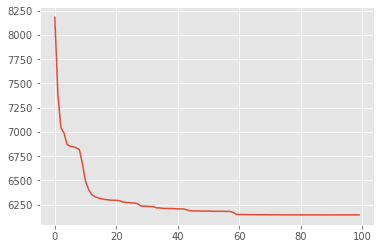

In [ ]:
plt.plot(decrease_loss, linestyle = 'solid')
plt.show()

## Testing the accuracy of the model

1. The test data split from MNIST has been used to create a new test dataset
2. The trained model is used for prediciting the labels of the images and also sum of the (image label and random number)
3. The predictions are evaluated against the original labels in the test dataset. 
4. Individual accuracies for image and random number sum are calculated by diving the right predictions with total records in the dataset
5. Combined accuracy where both are correctly predicted is also calculated 


### Creating Test dataset

In [ ]:
testData = MNISTAndRandomBinaryNumbers(val_set)
test_loader = torch.utils.data.DataLoader(testData
    ,batch_size=1000 
    ,shuffle=True
)

In [ ]:
def get_num_correct2(preds1, labels1,preds2, labels2):
  a = preds1.argmax(dim=1).eq(labels1)
  b = preds2.argmax(dim=1).eq(labels2)
  c = torch.logical_and(a, b)
  return a.sum().item(),b.sum().item(), c.sum().item()

In [ ]:
def accuracyCalculator(trainedModel, test_loader):
    images_correct=0
    random_sum_correct = 0
    total_loss=0
    with torch.no_grad():
      for images, labels,randomNumbers, sumlabels in test_loader:
        output1,output2 = network(images.to(device),randomNumbers.to(device))
        #images_correct += get_num_correct(output1.to(device), labels.to(device))
        #random_sum_correct += get_num_correct(output2.to(device), sumlabels.reshape(-1).to(device))#(sumlabels.reshape(batchSize)).type(torch.LongTensor).to(device))
        imgCount, sumCount, totalCount = get_num_correct2(output1.to(device), labels.to(device),output2.to(device), sumlabels.reshape(-1).to(device))
        images_correct += imgCount
        random_sum_correct +=sumCount
        total_loss += totalCount
    return images_correct,random_sum_correct,total_loss

In [ ]:
imgAcc, randSumAcc, totalAcc = accuracyCalculator(network,test_loader)

In [ ]:
imgAcc/10000,randSumAcc/10000,totalAcc/10000

(0.9897, 0.5507, 0.548)